In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import meanderpy as mp             
from importlib import reload
reload(mp)
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
mpl.rcParams['figure.dpi'] = 500
import scipy.stats as stats          
import seaborn as sns                   
from scipy import interpolate          
import random

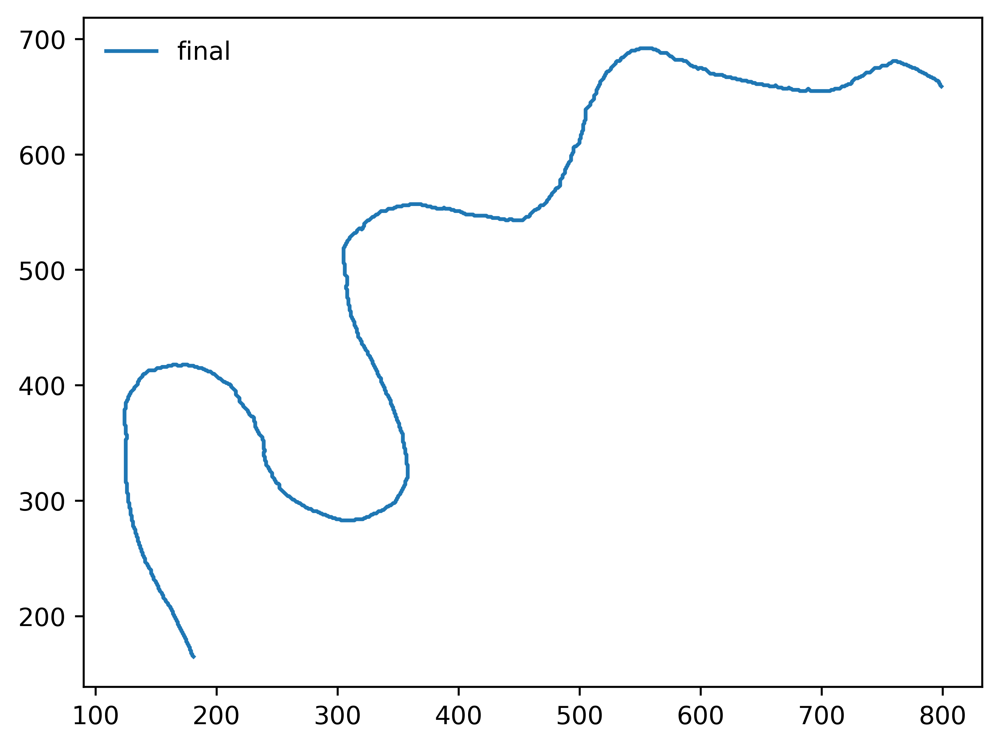

In [2]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('0.4.txt',delimiter=' ')
cl2=np.loadtxt('10.4.txt',delimiter=' ')

y = cl1[:,0][::-1]
x = cl1[:,1][::-1]
y1 = cl2[:,0][::-1]
x1= cl2[:,1][::-1]

plt.plot(x1,y1,label = 'final')
plt.legend(frameon=False)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 89.36it/s]


You are running this simulation for: 10.0 Years
Migration rate constant = 200.0 m/yr


/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/456633528.py:34: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  synx = 0.1*chb.channels[np.int(nit-1)].x
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/456633528.py:35: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your 

<AxesSubplot:xlabel='x'>

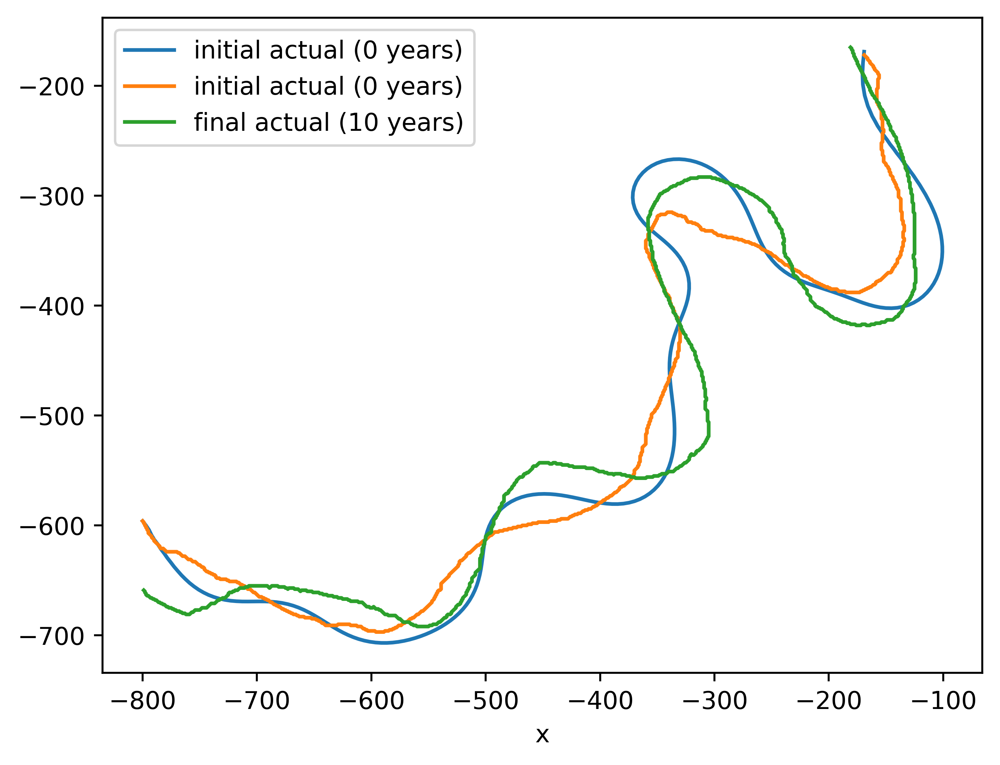

In [3]:
nit = 100                    # number of iterations
W = 100.0                    # channel width (m)
D = 10.0                      # channel depth (m)
depths = D * np.ones((nit,))  # channel depths for different iterations  
pad = 0# padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline           
Cfs = 0.02 * np.ones((nit,))
crdist = 1.8 * W               # threshold distance at which cutoffs occur
kl = 200/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0e-12               # vertical slope-dependent erosion rate constant (m/s)
dt = 0.1*(365*24*60*60.0)      # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 1                # which time steps will be saved
Sl = 0.0                     # initial slope (matters more for submarine channels than rivers)
t1 = 0                    # time step when incision starts
t2 = 0                    # time step when lateral migration starts
t3 = 0     
aggr_factor = 2e-9            # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)
sc = 1.0
y=cl1[:,0]*10
x=cl1[:,1]*10
z=np.zeros(len(x))
H=depths[0]

ch=mp.Channel(-x,-y,z,W,H)
chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
channel_coordinate = pd.DataFrame({"x":chb.channels[nit-1].x, "y":chb.channels[nit-1].y, "Z":chb.channels[nit-1].z}) # the way it work is this: chb.channels[i].x will give you the x coordinates for the ith time step
np.savetxt('output.txt', channel_coordinate, delimiter=',')

print('You are running this simulation for:', nit*dt/(365.*24*60*60),'Years')
print('Migration rate constant =', kl*60*60.*24.*365., 'm/yr')

synx = 0.1*chb.channels[np.int(nit-1)].x
syny = 0.1*chb.channels[np.int(nit-1)].y

np.savetxt('syn.txt', np.c_[syny,synx])
clsyn=np.loadtxt('syn.txt',delimiter=' ')
ax = pd.DataFrame({"x":clsyn[:,1], "y":clsyn[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)')
pd.DataFrame({"x":-cl1[:,1], "y":-cl1[:,0]}).plot.line(x='x', y='y', ax= ax, label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1], "y":-cl2[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (10 years)')

In [4]:
t = np.linspace(0,1,np.shape(cl1[:,])[0]) # create a new variable t 
x_o = -cl1[:,1].flatten()            # get x-axis data
y_o = -cl1[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)   
xnew_o = fx_o(tnew) + np.random.normal(0,0.1,1000)  # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.1,1000)# create a finer t-variable spacing 
xnew_o = fx_o(tnew)   # get interpolated x values
ynew_o = fy_o(tnew)   # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 2) 
#data_obs_ins =np.flip(data_obs_ins, axis=1)

t = np.linspace(0,1,np.shape(cl2[:,])[0]) # create a new variable t 
x_o = -cl2[:,1].flatten()            # get x-axis data
y_o = -cl2[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)           # create a finer t-variable spacing 
xnew_o = fx_o(tnew)                     # get interpolated x values
ynew_o = fy_o(tnew)
data_obs = np.array([xnew_o,ynew_o])
data_obs = np.flip(data_obs, axis=1)
data_obs = np.round(data_obs, 1)
# modelled

t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
x_m = 0.1*chb.channels[np.int(nit-1)].x
y_m = 0.1*chb.channels[np.int(nit-1)].y
fx_m = interpolate.interp1d(t,x_m)
fy_m = interpolate.interp1d(t, y_m)
tnew = np.linspace(0,1,1000)
xnew_m = fx_m(tnew)
ynew_m = fy_m(tnew)
ynew_ms = ynew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
xnew_ms = xnew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
ynew_ms = ynew_m
xnew_ms = xnew_m

/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/458386601.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/458386601.py:29: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. 

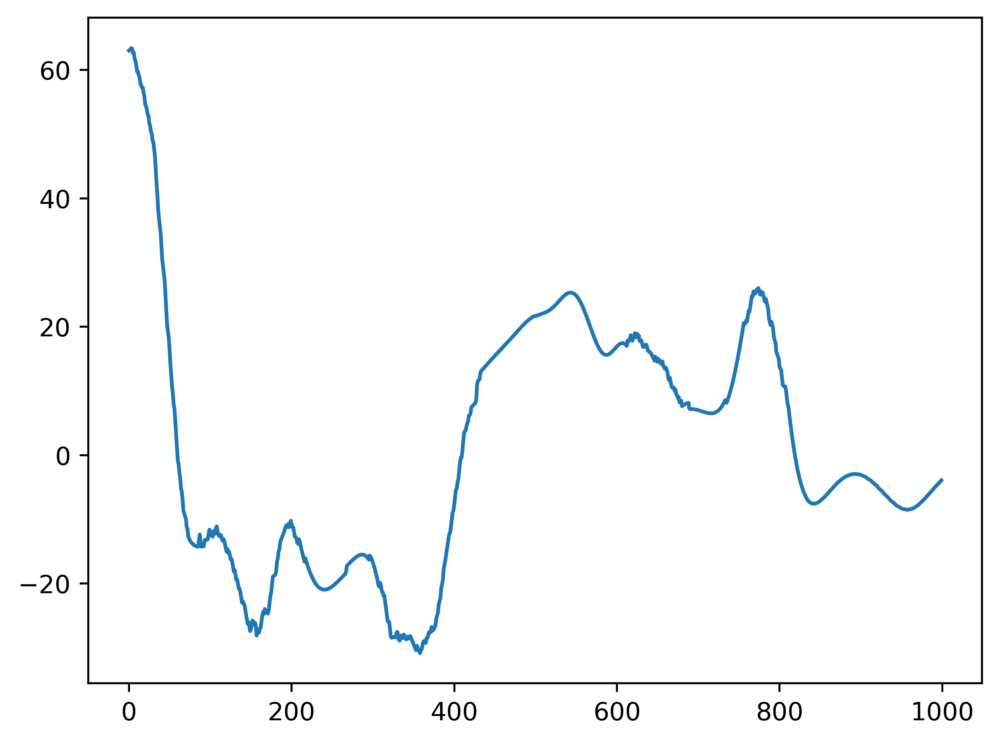

In [5]:
data_obs =np.flip(data_obs, axis=1)
err1 = data_obs_ins[0,:] - data_obs[0,:]
err2 = xnew_ms - data_obs[0,:]
plt.plot(ynew_ms - data_obs[1,:])

In [6]:
nit = 100                   
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0      

def hkm(parm):  
    kl =  (parm[0]*10)/(365*24*60*60.0)  
    Cfs = parm[1] * 0.001 * np.ones((nit,))
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]

    try:    
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = 0.1*chb.channels[np.int(nit-1)].x
            y_m = 0.1*chb.channels[np.int(nit-1)].y

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,1000)
            xnew_m = fx_m(tnew) 
            ynew_m = fy_m(tnew) 
            xnew_m[:] = xnew_m[::-1] 
            ynew_m[:] = ynew_m[::-1] 
        
        else:
            t = np.linspace(0,1,1000)
            xnew_m = np.zeros(1000) 
            ynew_m = np.zeros(1000) 
            ynew_m[:] = ynew_m[::-1] 
            xnew_m[:] = xnew_m[::-1] 

    except:
        t = np.linspace(0,1,1000)
        xnew_m = np.zeros(1000) 
        ynew_m = np.zeros(1000) 
        ynew_m[:] = ynew_m[::-1] 
        xnew_m[:] = xnew_m[::-1] 
        
    return np.array([xnew_m,ynew_m])

[15 20  1]
[15 20  1]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.99it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

-4920.0040621125245

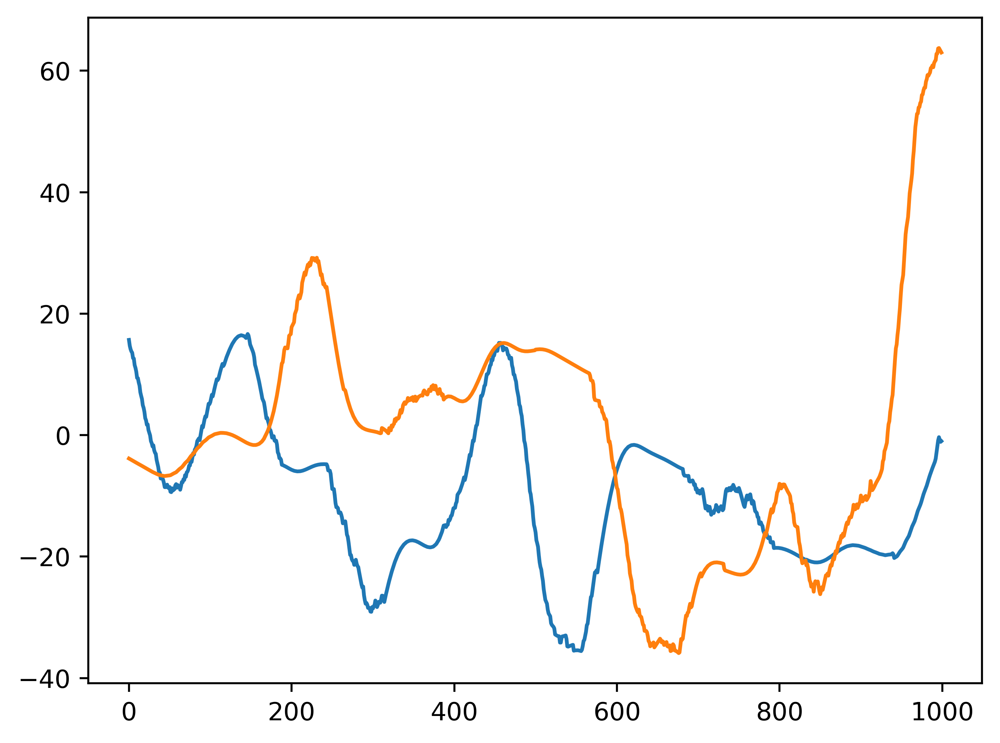

In [7]:
def log_prior(par):
    
    if  10 < par[0] < 50 and 0 < par[1] < 30 and 0.01 < par[2] < 10:   # define the bounds of the prior   
        return -par[2]/1                           # return the exponential distribution
    else:
        return -np.inf
    
def log_lik(par,data):
    print(par)
    sim = hkm(parm=par[:2])
    
    x_err = sim[0,:]-data[0,:][::-1]
    y_err = sim[1,:]-data[1,:][::-1]
    plt.plot(x_err) 
    plt.plot(y_err) 

    y_fft = np.fft.fft(y_err)  # do the fast fourier transform of y-errrors
    x_fft = np.fft.fft(x_err)  # do the fast fourier transform of x-errrors
    
    y_amp1 = 2*abs(y_fft.real/y_fft.size)      # retrieve amplitude of cos function
    y_amp2 = 2*abs(y_fft.imag/y_fft.size)      # retrieve amplitude of sin function
    x_amp1 = 2*abs(x_fft.real/x_fft.size)      # retrieve amplitude of cos function
    x_amp2 = 2*abs(x_fft.imag/x_fft.size)      # retrieve amplitude of sin function
    
    amp = np.array([y_amp1,y_amp2,x_amp1,x_amp2]) # write all four amplitudes in one array 
    
    return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array

def log_post(par, data):
    par = np.around(par, decimals = 0)
    print (par)
    if (log_prior(par)==-np.inf):
        lp = log_prior(par)
    else: 
        lp = log_lik(par,data)+ log_prior(par)
    return lp  

#Test Run
log_post([15,20 ,1],data_obs)

In [8]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=10, sd=15, low=0, upp=50)
X2 = get_truncated_normal(mean=5, sd=10, low=0, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

In [9]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=15, sd=10, low=1, upp=40)
X2 = get_truncated_normal(mean=10, sd=10, low=1, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

[10.  3.  3.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.92it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

[10. 16.  3.]
[12. 15.  3.]
[12. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 278.49it/s]


[26. 14.  4.]
[26. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 277.56it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 166.64it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/3400913311.py:27: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array


[34. 12.  1.]
[34. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 240.72it/s]


[21.  7.  2.]
[21.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 332.77it/s]


[16.  9.  4.]
[16.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.27it/s]


[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.52it/s]


[10.  9.  4.]
[ 9. 16.  4.]
[31. 15.  1.]
[31. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 298.61it/s]


[37.  9.  2.]
[37.  9.  2.]


100%|█████████████████████████████████████████| 100/100 [00:30<00:00,  3.32it/s]


[7. 3. 2.]
[23.  7.  2.]
[23.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.57it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.12it/s]


[ 8. 10.  2.]
[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 321.71it/s]


[9. 3. 3.]
[ 5. 10.  1.]
[15. 20.  2.]
[15. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.60it/s]


[6. 5. 2.]
[ 8. 13.  2.]
[25.  6.  2.]
[25.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.47it/s]


[ 7. 18.  3.]
[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.74it/s]


[5. 9. 2.]
[27. 15.  3.]
[27. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 308.81it/s]


[ 3. 10.  2.]
[26. 14.  3.]
[26. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.00it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.21it/s]


[30. 15.  2.]
[30. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 355.32it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.07it/s]


[ 1. 10.  2.]
[13. 20.  2.]
[13. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.96it/s]


[21. 17.  3.]
[21. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.69it/s]


[24.  8.  3.]
[24.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.11it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.80it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.79it/s]


[ 6. 10.  1.]
[24. 17.  2.]
[24. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.69it/s]


[16.  5.  3.]
[16.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.47it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.51it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.02it/s]


[23.  4.  3.]
[23.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.75it/s]


[14.  9.  4.]
[14.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.80it/s]


[10. 16.  2.]
[4. 7. 2.]
[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.64it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.98it/s]


[13. 16.  4.]
[13. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.48it/s]


[36. 12.  0.]
[53. 14.  1.]
[19.  8.  5.]
[19.  8.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.22it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 451.51it/s]


[ 8. 17.  4.]
[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.70it/s]


[36.  9.  2.]
[36.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 179.84it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.44it/s]


[ 9. 10.  2.]
[ 8. -0.  2.]
[ 8. 13.  2.]
[32.  7.  3.]
[32.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 332.91it/s]


[40. 18.  3.]
[40. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 282.52it/s]


[30. 18.  3.]
[30. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 364.84it/s]


[18.  8.  2.]
[18.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.99it/s]


[-1. 11.  1.]
[25. 11.  3.]
[25. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 359.40it/s]


[2. 8. 1.]
[13. 16.  2.]
[13. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.79it/s]


[18. 21.  1.]
[18. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 374.63it/s]


[28.  5.  3.]
[28.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 285.46it/s]


[25. 11.  6.]
[25. 11.  6.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.98it/s]


[11. 10.  2.]
[11. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 420.30it/s]
/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


[ 8. -4.  3.]
[13. 18.  2.]
[13. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 374.46it/s]


[23. 16.  3.]
[23. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 384.55it/s]


[19.  9.  3.]
[19.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 344.04it/s]


[ 2. 10.  5.]
[7. 5. 3.]
[25.  6.  2.]
[25.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.27it/s]


[25.  9.  3.]
[25.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 119.62it/s]


[ 3. 11.  1.]
[18. 23.  3.]
[18. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.21it/s]


[3. 5. 2.]
[-9. 24.  3.]
[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.15it/s]


[-13.   5.   3.]
[-5.  9.  3.]
[35. 16.  2.]
[35. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 262.64it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.65it/s]


[14. 15.  3.]
[14. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.03it/s]


[31. 21.  3.]
[31. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.58it/s]


[-13.   9.   1.]
[35. 21.  2.]
[35. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 176.60it/s]


[15.  6.  3.]
[15.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.18it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.22it/s]


[11. 15.  2.]
[11. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.87it/s]


[5. 8. 2.]
[ 8. -4.  4.]
[11. 18.  2.]
[11. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.60it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.14it/s]


[28. 13. -0.]
[10. 13.  3.]
[12.  9.  4.]
[12.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.91it/s]


[14.  7.  2.]
[14.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.93it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.55it/s]


[ 6. 10.  2.]
[9. 2. 3.]
[17. 20.  3.]
[17. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.89it/s]


[-6. -1.  1.]
[25.  5.  2.]
[25.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 409.84it/s]


[ 6. 20.  3.]
[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.91it/s]


[25.  6.  2.]
[25.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.05it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.05it/s]


[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.81it/s]


[25. 16.  2.]
[25. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 377.34it/s]


[20.  7.  3.]
[20.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.42it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.44it/s]


[23. 25.  1.]
[23. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.10it/s]


[29.  3.  3.]
[29.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 258.16it/s]


[ 9. 13.  2.]
[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.03it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.47it/s]


[24. 18.  3.]
[24. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.78it/s]


[47. 15.  1.]
[47. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 106.63it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.89it/s]


[24. -0.  6.]
[ 5. 19.  4.]
[40.  8.  2.]
[40.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 259.31it/s]


[6. 3. 2.]
[22.  7.  2.]
[22.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.03it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 411.48it/s]


[ 5. 10.  1.]
[ 5. 16.  1.]
[7. 6. 3.]
[27. 14.  3.]
[27. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.98it/s]


[10.  8.  2.]
[24. 15.  3.]
[24. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.48it/s]


[31. 15.  2.]
[31. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 305.32it/s]


[10.  9.  2.]
[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.44it/s]

[21. 16.  3.]
[21. 16.  3.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.16it/s]


[ 4. 13.  1.]
[ 9. 18.  2.]
[9. 9. 2.]
[16.  9.  3.]
[16.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.50it/s]


[0. 7. 1.]
[-1. -3.  4.]
[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.17it/s]


[23. 16.  3.]
[23. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.71it/s]


[42. 13.  1.]
[42. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 358.50it/s]


[18.  8.  4.]
[18.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.72it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 414.23it/s]


[38.  8.  2.]
[38.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 260.47it/s]


[-7. -4.  2.]
[23.  7.  2.]
[23.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.61it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.44it/s]


[28.  6.  3.]
[28.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 371.10it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 416.74it/s]


[24. 15.  3.]
[24. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 426.34it/s]


[ 8. 11.  2.]
[25. 14.  3.]
[25. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.15it/s]


[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.23it/s]


[38. 22.  3.]
[38. 22.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 334.57it/s]


[24. 10.  3.]
[24. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.31it/s]


[11.  8.  2.]
[11.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.80it/s]


[14. 17.  2.]
[14. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.41it/s]


[29. 20.  3.]
[29. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 318.56it/s]


[28.  4.  3.]
[28.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 305.98it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.58it/s]


[25.  3.  3.]
[25.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 202.62it/s]


[-0. -0. -0.]
[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.23it/s]


[18. 20.  3.]
[18. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.73it/s]


[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 379.85it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.62it/s]


[16.  8.  3.]
[16.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.35it/s]


[ 9. 16.  4.]
[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.06it/s]


[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.17it/s]


[ 8. -0.  3.]
[ 2. 14.  0.]
[-3. 29.  3.]
[8. 6. 2.]
[ 5. 15.  2.]
[26. 10.  3.]
[26. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 345.97it/s]


[10. 15.  3.]
[3. 7. 3.]
[19.  3.  2.]
[19.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.03it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.63it/s]


[15. 19.  1.]
[15. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.91it/s]


[-1. 10.  2.]
[-1. 12.  1.]
[23. 26.  1.]
[23. 26.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 320.83it/s]


[17.  6.  4.]
[17.  6.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.28it/s]


[-1. 20.  2.]
[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.94it/s]


[15. 18.  3.]
[15. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.68it/s]


[40. 16.  1.]
[40. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 240.30it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.84it/s]


[ 7. 12.  3.]
[21. 10.  1.]
[21. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.56it/s]


[40.  8.  1.]
[40.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 244.87it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.11it/s]


[22.  9.  3.]
[22.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 379.85it/s]


[10. 26.  3.]
[5. 5. 2.]
[39.  5.  3.]
[39.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 391.46it/s]


[-5. 23.  3.]
[ 3. 12.  2.]
[ 7. 13.  2.]
[30. 18.  4.]
[30. 18.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.84it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.96it/s]


[-12.   8.   2.]
[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.69it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 421.92it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.25it/s]


[33. 21.  1.]
[33. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 289.95it/s]


[16. 21.  2.]
[16. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.78it/s]


[18. 21.  1.]
[18. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.84it/s]


[12. 16.  2.]
[12. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.24it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.32it/s]


[16. -3.  4.]
[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.93it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.00it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.08it/s]


[31. 13.  1.]
[31. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 326.65it/s]


[24.  9.  2.]
[24.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 330.15it/s]


[16.  8.  4.]
[16.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.00it/s]


[ 9. 11.  3.]
[13.  5.  3.]
[13.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 362.31it/s]


[21.  7.  2.]
[21.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 354.26it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 406.43it/s]


[19.  6.  2.]
[19.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 409.05it/s]


[ 9. 11.  1.]
[ 8. 13.  2.]
[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.11it/s]


[26. 16.  3.]
[26. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 307.61it/s]


[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 233.65it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.44it/s]


[21.  9.  2.]
[21.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.45it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.11it/s]


[-1.  6.  1.]
[22.  4.  3.]
[22.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.06it/s]


[25.  4.  3.]
[25.  4.  3.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 86.84it/s]


[-5. 10.  5.]
[-2.  6.  1.]
[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.14it/s]


[18. 19.  3.]
[18. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.67it/s]


[31. 16.  0.]
[53.  9.  0.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.47it/s]


[11. 13.  3.]
[11. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.08it/s]


[10. 14.  3.]
[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.21it/s]


[11.  2.  1.]
[11.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.77it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.34it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.56it/s]


[21.  6.  2.]
[21.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.08it/s]


[14. 23.  4.]
[14. 23.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.77it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.56it/s]


[6. 9. 2.]
[ 2. 10.  2.]
[34. 14.  4.]
[34. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 218.31it/s]


[24. 14.  2.]
[24. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.07it/s]


[21. 23.  3.]
[21. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.24it/s]


[22. 16.  3.]
[22. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.93it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.85it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.94it/s]


[21.  7.  3.]
[21.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.71it/s]


[12.  8.  3.]
[12.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.68it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.42it/s]


[13.  5.  2.]
[13.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.80it/s]


[ 4. 16.  3.]
[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.67it/s]


[18.  8.  4.]
[18.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.26it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.05it/s]


[35.  8.  2.]
[35.  8.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 76.62it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.33it/s]


[21. 11.  3.]
[21. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.34it/s]


[-10.  10.   1.]
[-3. -4.  1.]
[10. 13.  2.]
[29.  1.  3.]
[29.  1.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 372.97it/s]


[ 5. 19.  3.]
[28. 14.  2.]
[28. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 391.47it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.06it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.52it/s]


[-11.   6.   2.]
[23. 11.  3.]
[23. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.69it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.35it/s]


[28. 17.  2.]
[28. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.14it/s]


[13. 19.  2.]
[13. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.80it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.29it/s]


[28. -4.  3.]
[10. 11.  2.]
[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.50it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.78it/s]


[13. 20.  1.]
[13. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.23it/s]


[29. 17.  1.]
[29. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 264.17it/s]


[ 3. 17.  5.]
[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 364.18it/s]


[36.  8.  2.]
[36.  8.  2.]


100%|█████████████████████████████████████████| 100/100 [00:07<00:00, 12.64it/s]


[5. 2. 4.]
[24. 13.  4.]
[24. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.84it/s]


[20.  3.  3.]
[20.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.81it/s]


[10. 13.  2.]
[-3.  6.  1.]
[ 8. 12.  2.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.81it/s]


[3. 8. 2.]
[30. 22.  3.]
[30. 22.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.32it/s]


[ 2. 11.  2.]
[35. 13.  6.]
[35. 13.  6.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 241.14it/s]


[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.06it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.44it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.49it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.95it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.25it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.10it/s]


[-1.  4.  1.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.83it/s]


[13.  7.  3.]
[13.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.23it/s]


[18. 17.  3.]
[18. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.60it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.21it/s]


[33. 12.  1.]
[33. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 325.38it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.48it/s]


[15.  6.  5.]
[15.  6.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.59it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.21it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.79it/s]


[17.  9.  3.]
[17.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.90it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.61it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 408.10it/s]


[18. 20.  2.]
[18. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.82it/s]


[29.  2.  4.]
[29.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 396.11it/s]


[ 6. 22.  3.]
[16. 17.  1.]
[16. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.45it/s]


[ 6. 13.  2.]
[22. 28.  2.]
[22. 28.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.66it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.92it/s]


[33. 12.  2.]
[33. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 251.88it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 396.46it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 383.82it/s]


[16.  7.  2.]
[16.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 418.45it/s]


[17. 23.  1.]
[17. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.16it/s]


[19.  6.  3.]
[19.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 399.98it/s]


[20. 11.  4.]
[20. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.73it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 262.77it/s]


[12. 11.  3.]
[12. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.39it/s]


[45.  9.  1.]
[45.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 317.74it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 328.23it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.53it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.40it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.01it/s]


[23. 14.  3.]
[23. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.37it/s]


[1. 5. 3.]
[19. 19.  3.]
[19. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.86it/s]


[ 3. 15.  1.]
[28.  2.  4.]
[28.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 430.64it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.54it/s]


[-8.  6.  3.]
[36. 22.  2.]
[36. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 264.96it/s]


[ 7. 11.  2.]
[31. 19.  2.]
[31. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.32it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.18it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.29it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.96it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.90it/s]


[14. 25.  1.]
[14. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.44it/s]


[18.  6.  3.]
[18.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.38it/s]


[ 4. 26.  3.]
[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.44it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.98it/s]


[17. 20.  2.]
[17. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.15it/s]


[13. 20.  1.]
[13. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.30it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.70it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.06it/s]


[15. 15.  3.]
[15. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.30it/s]


[12. 16.  3.]
[12. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.55it/s]


[20.  8.  1.]
[20.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.03it/s]


[53.  5.  1.]
[17. 10.  3.]
[17. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.49it/s]


[19. 18. -1.]
[-1. 10. -0.]
[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.78it/s]


[23. 20.  2.]
[23. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 417.00it/s]


[50. 31.  3.]
[ 7. 11.  2.]
[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.36it/s]


[17.  6.  2.]
[17.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.49it/s]


[12. 16. -1.]
[15. 17.  2.]
[15. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.56it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.05it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.80it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.93it/s]


[16. 10.  3.]
[16. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.08it/s]


[10.  9.  2.]
[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.27it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.98it/s]


[21. 24.  3.]
[21. 24.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.06it/s]


[11. 26.  0.]
[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.25it/s]


[33.  9.  2.]
[33.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.20it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.80it/s]


[13. 16.  3.]
[13. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.66it/s]


[38.  8.  2.]
[38.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 322.72it/s]


[18. 11.  3.]
[18. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.62it/s]


[12. 11.  3.]
[12. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.43it/s]


[13. 11.  3.]
[13. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.83it/s]


[ 4. 10.  1.]
[10.  9.  2.]
[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.82it/s]


[17. 18. -0.]
[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.21it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.23it/s]


[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.12it/s]


[22.  7.  3.]
[22.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.33it/s]


[17. 29.  1.]
[17. 29.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 308.50it/s]


[24.  4.  3.]
[24.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 364.09it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.26it/s]


[6. 8. 2.]
[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 384.05it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 405.82it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.63it/s]


[13. 14.  3.]
[13. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 416.47it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.50it/s]


[20. 10. -1.]
[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.34it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.77it/s]


[22.  2.  2.]
[22.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.91it/s]


[18. 23.  3.]
[18. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.67it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.76it/s]


[10. 14.  2.]
[26.  5.  3.]
[26.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 397.06it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.31it/s]


[13. 11.  2.]
[13. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.31it/s]


[-1.  8.  3.]
[25. 19.  2.]
[25. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.24it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.13it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.01it/s]


[-2. 10.  2.]
[13. 18.  2.]
[13. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.20it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.79it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.12it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.79it/s]


[20. 20.  2.]
[20. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.93it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.86it/s]


[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.16it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.64it/s]


[18. 25.  3.]
[18. 25.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.73it/s]


[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 146.86it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 178.53it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.62it/s]


[21. 23.  4.]
[21. 23.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 425.09it/s]


[18. 10.  3.]
[18. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.78it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.89it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.89it/s]


[10.  9.  3.]
[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.17it/s]


[ 6. 11.  1.]
[16. 28.  4.]
[16. 28.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.93it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.72it/s]


[30. 23.  3.]
[30. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 279.23it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.19it/s]


[13. 19.  2.]
[13. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.24it/s]


[24. 21.  2.]
[24. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 429.35it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.78it/s]


[35. 25.  2.]
[35. 25.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 257.56it/s]


[15. 17.  1.]
[15. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.44it/s]


[19.  1.  3.]
[19.  1.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.29it/s]


[18. 24.  2.]
[18. 24.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.09it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.93it/s]


[16. 17.  1.]
[16. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.92it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.27it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.30it/s]


[16.  9.  4.]
[16.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.53it/s]


[14. 13.  3.]
[14. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.50it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.15it/s]


[54.  3.  1.]
[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 356.15it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.16it/s]


[10. 13.  2.]
[29.  1.  4.]
[29.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.55it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 374.72it/s]


[3. 6. 2.]
[-1. 10.  2.]
[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 301.72it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 329.09it/s]


[13. 15.  0.]
[ 2. 10.  2.]
[10. 13.  3.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 336.53it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 321.25it/s]


[11. 12.  0.]
[17.  5.  2.]
[17.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 379.53it/s]


[8. 8. 3.]
[5. 8. 2.]
[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 327.39it/s]


[22. 21.  1.]
[22. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.78it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.08it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.10it/s]


[15. 12.  4.]
[15. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.45it/s]


[10. 14.  3.]
[15. 10.  3.]
[15. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.82it/s]


[28.  8.  1.]
[28.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 417.37it/s]


[10.  9.  3.]
[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.32it/s]


[ 7. 12.  2.]
[34. -2.  4.]
[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 430.27it/s]


[29. 23.  3.]
[29. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 324.50it/s]


[ 3. 10.  2.]
[8. 9. 3.]
[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.21it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.38it/s]


[ 2. 11.  2.]
[14. 17.  2.]
[14. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.61it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.82it/s]


[10. 14.  0.]
[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.33it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.77it/s]


[9. 9. 2.]
[23.  9.  3.]
[23.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.31it/s]


[16. 19.  2.]
[16. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.74it/s]


[28. 14.  2.]
[28. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 353.19it/s]


[ 8. 28.  1.]
[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.63it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.85it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.91it/s]


[53.  6.  1.]
[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.66it/s]


[21. 12.  3.]
[21. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.76it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.06it/s]


[-6.  5.  2.]
[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.53it/s]


[16. 15.  3.]
[16. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.98it/s]


[6. 9. 2.]
[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.38it/s]


[24.  9.  4.]
[24.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 316.26it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.63it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.52it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.00it/s]


[26. 19.  3.]
[26. 19.  3.]


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 39.75it/s]


[18.  6.  3.]
[18.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.35it/s]


[12.  8.  3.]
[12.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.65it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.86it/s]


[23. 19.  1.]
[23. 19.  1.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 86.75it/s]


[17. 20.  2.]
[17. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.69it/s]


[16. 18.  1.]
[16. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.55it/s]


[17. 16.  3.]
[17. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.25it/s]


[22. 11.  4.]
[22. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 374.72it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 311.09it/s]


[ 9. 10.  3.]
[14. 15.  3.]
[14. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 358.42it/s]


[56. 10.  1.]
[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 346.31it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 362.95it/s]


[10. 10.  3.]
[20. 13.  3.]
[20. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 350.88it/s]


[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 261.23it/s]


[33. 24.  3.]
[33. 24.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 280.77it/s]


[-1. 11.  2.]
[19. 13.  3.]
[19. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.89it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.01it/s]


[25. 15.  1.]
[25. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 304.80it/s]


[ 1. 10.  2.]
[27. 14.  2.]
[27. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.23it/s]


[10. 16. -0.]
[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.06it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.67it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.27it/s]


[25. 16.  1.]
[25. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 357.02it/s]


[20.  6.  3.]
[20.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.15it/s]


[13. 17.  2.]
[13. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.24it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.17it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.22it/s]


[36. 15.  0.]
[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.28it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 415.93it/s]


[10.  9.  2.]
[-8.  5.  1.]
[18. 19.  3.]
[18. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.61it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.96it/s]


[ 7. 12.  2.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.00it/s]


[25. 16.  2.]
[25. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 360.87it/s]


[ 8. 11.  2.]
[16. 16.  0.]
[ 9. 20.  3.]
[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 405.83it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.42it/s]


[21. 21.  2.]
[21. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 409.14it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.05it/s]


[20.  1.  2.]
[20.  1.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.04it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.96it/s]


[19. 19.  3.]
[19. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.89it/s]


[3. 8. 2.]
[27.  9.  3.]
[27.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 390.94it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.35it/s]


[32. 28.  3.]
[32. 28.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 283.93it/s]


[15. 18.  1.]
[15. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.43it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.35it/s]


[27. 13.  2.]
[27. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 269.00it/s]


[40. 12.  2.]
[40. 12.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 71.32it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.11it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.26it/s]


[27. 10.  1.]
[27. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.57it/s]


[15.  7.  2.]
[15.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 550.24it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.31it/s]


[17. 20.  2.]
[17. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.21it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.45it/s]


[21. 16.  4.]
[21. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.75it/s]


[2. 7. 3.]
[43. 35.  3.]
[ 3. 10.  2.]
[17. 12.  3.]
[17. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.17it/s]


[31. 14.  3.]
[31. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 343.95it/s]


[25. 16.  2.]
[25. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 346.00it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.84it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.10it/s]


[21.  5.  3.]
[21.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 316.74it/s]


[4. 6. 2.]
[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 368.59it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 371.82it/s]


[10.  5.  2.]
[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 355.03it/s]


[56. -2.  2.]
[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 363.88it/s]


[30. 18.  3.]
[30. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 283.55it/s]


[13. 10.  3.]
[13. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.06it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.61it/s]


[-1.  8.  2.]
[28.  2.  4.]
[28.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.18it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.03it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.22it/s]


[18. 21.  0.]
[2. 9. 2.]
[22. 22.  2.]
[22. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.54it/s]


[14.  5.  2.]
[14.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.70it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.50it/s]


[23. 20.  2.]
[23. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.55it/s]


[18. 16.  0.]
[24. 15.  3.]
[24. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.90it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.23it/s]


[ 8. 11.  2.]
[12. 17.  2.]
[12. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.42it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.98it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.30it/s]


[33. 29.  3.]
[33. 29.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 166.83it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.02it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.69it/s]


[16. 11.  4.]
[16. 11.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.01it/s]


[13. 10.  3.]
[13. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.77it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.71it/s]


[29.  9.  2.]
[29.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 322.75it/s]


[13. 10.  3.]
[13. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.49it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.90it/s]


[15. 12.  3.]
[15. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.46it/s]


[23.  8.  2.]
[23.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.22it/s]


[12. 10.  1.]
[12. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.55it/s]


[12. 16.  2.]
[12. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.93it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.90it/s]


[43. 32.  4.]
[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.74it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.67it/s]


[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.43it/s]


[20. 27.  1.]
[20. 27.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.79it/s]


[10. 12.  1.]
[16. 17.  1.]
[16. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.86it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.03it/s]


[0. 7. 1.]
[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.08it/s]


[19. 22.  2.]
[19. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.34it/s]


[15. 18.  1.]
[15. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.37it/s]


[28. 18.  2.]
[28. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.50it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.58it/s]


[19. 21.  2.]
[19. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.68it/s]


[22.  4. -0.]
[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.41it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.48it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.75it/s]


[ 9. 13.  2.]
[31. -1.  4.]
[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.78it/s]


[0. 5. 3.]
[ 9. 13.  2.]
[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.12it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.04it/s]


[ 2. 11.  2.]
[25. 19.  2.]
[25. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.46it/s]


[26. 13.  2.]
[26. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 294.09it/s]


[23. 20.  2.]
[23. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 407.50it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.30it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.98it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.96it/s]


[19.  5.  3.]
[19.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.40it/s]


[13. 10.  3.]
[13. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.63it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.57it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 362.23it/s]


[27.  9.  2.]
[27.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.64it/s]


[34. 11.  1.]
[34. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 289.41it/s]


[21. 20.  3.]
[21. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.57it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 360.39it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 384.16it/s]


[12. 12.  2.]
[12. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 436.86it/s]


[19. 13.  3.]
[19. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.98it/s]


[16.  4.  2.]
[16.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.32it/s]


[5. 4. 1.]
[-0.  7.  3.]
[34. 25.  3.]
[34. 25.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 144.91it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.60it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 418.53it/s]


[ 1. 10.  2.]
[13. 18.  2.]
[13. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.04it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.54it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 424.43it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.50it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.53it/s]


[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.61it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.28it/s]


[15.  8.  2.]
[15.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.55it/s]


[-12.  -2.   2.]
[ 9. 21.  2.]
[15. 17.  2.]
[15. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.99it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.79it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.53it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.68it/s]


[ 5. 26.  1.]
[27. 12.  2.]
[27. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 255.05it/s]


[36.  9.  2.]
[36.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 184.61it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.99it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.24it/s]


[17. 23.  2.]
[17. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.92it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.68it/s]


[10. 13.  2.]
[26.  7.  3.]
[26.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 429.65it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.52it/s]


[21. 14.  3.]
[21. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.04it/s]


[-1. 11.  2.]
[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.17it/s]


[16. 16.  0.]
[19. 32.  1.]
[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.96it/s]


[19. 26.  1.]
[19. 26.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.84it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.59it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.80it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.63it/s]


[17. 20.  2.]
[17. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.63it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.27it/s]


[26. 14.  2.]
[26. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.20it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.79it/s]


[15. 25.  0.]
[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.91it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.43it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.27it/s]


[19. 20.  3.]
[19. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.30it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.88it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.28it/s]


[28.  2.  4.]
[28.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 425.76it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.08it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.46it/s]


[ 6. 10.  3.]
[-23.  -2.   2.]
[-5.  9.  2.]
[14. 18.  2.]
[14. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.52it/s]


[23. 10.  3.]
[23. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.96it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.94it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.37it/s]


[10. 11.  2.]
[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.31it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.36it/s]


[7. 6. 4.]
[ 8. 11.  1.]
[19. 24.  1.]
[19. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.36it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.09it/s]


[53. 13.  1.]
[17.  8.  4.]
[17.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.26it/s]


[15.  9.  2.]
[15.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.70it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.21it/s]


[35.  9.  2.]
[35.  9.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 74.62it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.86it/s]


[24.  9.  1.]
[24.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 337.34it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.65it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.71it/s]


[12.  9.  1.]
[12.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.99it/s]


[36. 27.  3.]
[36. 27.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 335.82it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.31it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.61it/s]


[36. 22.  0.]
[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.20it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.20it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.91it/s]


[10. 13. -0.]
[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.14it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.76it/s]


[10. 10.  1.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.65it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.82it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.85it/s]


[36. 11.  1.]
[36. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.02it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.34it/s]


[17. 20.  1.]
[17. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.64it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.72it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 403.24it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.14it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.08it/s]


[ 5. 10.  2.]
[19.  6.  3.]
[19.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.79it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.43it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.40it/s]


[35. 26.  3.]
[35. 26.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 139.97it/s]


[ 8. 11.  2.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.62it/s]


[19. 16.  0.]
[-15.  10.   3.]
[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.39it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.30it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.66it/s]


[19.  7.  3.]
[19.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.93it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.18it/s]


[20. 20.  2.]
[20. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.95it/s]


[5. 8. 2.]
[ 9. 13.  1.]
[22. 21.  1.]
[22. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.50it/s]


[19. 22.  2.]
[19. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.53it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.48it/s]


[23. 18.  3.]
[23. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.78it/s]


[21. 10.  2.]
[21. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.45it/s]


[ 9. 10.  1.]
[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.69it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.04it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.71it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.66it/s]


[11. 14.  2.]
[11. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.39it/s]


[40. -8.  6.]
[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.47it/s]


[4. 9. 2.]
[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.54it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.07it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.77it/s]


[23. 17.  2.]
[23. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 401.35it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.77it/s]


[20. 28.  2.]
[20. 28.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.91it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.76it/s]


[ 5. 14.  0.]
[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.11it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.34it/s]


[ 9. 20.  0.]
[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.35it/s]


[13. 16.  1.]
[13. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.13it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 386.88it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 313.99it/s]


[41. 12.  1.]
[41. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 169.26it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 421.34it/s]


[16.  8.  4.]
[16.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.01it/s]


[ 7. 13.  3.]
[17. 23.  3.]
[17. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 387.23it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.29it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.54it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.34it/s]


[2. 6. 3.]
[18. 22.  0.]
[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.84it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.56it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.41it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.45it/s]


[20. 30.  1.]
[19. 22. -0.]
[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.83it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.82it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.78it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.72it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.22it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.88it/s]


[12. 23.  1.]
[12. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.59it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.89it/s]


[19. 17.  4.]
[19. 17.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.76it/s]


[25.  4.  0.]
[45.  6.  2.]
[45.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 223.62it/s]


[23. 18.  2.]
[23. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.60it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 422.39it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.13it/s]


[13.  2.  2.]
[13.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.10it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.87it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.75it/s]


[33. -5.  5.]
[35. 26.  3.]
[35. 26.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 134.42it/s]


[ 1. 10.  2.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.91it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.82it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.87it/s]


[ 7. 12.  2.]
[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.38it/s]


[13. 20.  0.]
[11. 12.  3.]
[11. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.75it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.33it/s]


[-7. -3.  1.]
[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.94it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.41it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.72it/s]


[14. 17.  2.]
[14. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.17it/s]


[21.  9.  1.]
[21.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 430.14it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.25it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.35it/s]


[28.  7.  1.]
[28.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 381.36it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.76it/s]


[16.  8.  2.]
[16.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.36it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.18it/s]


[ 9. 11.  2.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.86it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.56it/s]


[-9.  5.  2.]
[18. 18.  3.]
[18. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.60it/s]


[25.  7.  3.]
[25.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.87it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.76it/s]


[20. 25.  2.]
[20. 25.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.72it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.54it/s]


[10. 12.  1.]
[10. 11.  1.]
[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.42it/s]


[-11.   1.   1.]
[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.92it/s]


[ 7. 11.  1.]
[15. 17.  3.]
[15. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.34it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.65it/s]


[27. 12.  1.]
[27. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 258.39it/s]


[20. 19.  3.]
[20. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 357.97it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.83it/s]


[14. 11.  2.]
[14. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 359.32it/s]


[19. 17.  5.]
[19. 17.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 333.56it/s]


[59.  4.  1.]
[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 384.32it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 372.74it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 353.49it/s]


[24. 18.  1.]
[24. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.63it/s]


[ 7. 15.  1.]
[44. -9.  7.]
[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.92it/s]


[25. 21.  2.]
[25. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.53it/s]


[ 4. 11.  2.]
[18. 13.  4.]
[18. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.06it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.27it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.25it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.90it/s]


[13. 20.  0.]
[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.58it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.93it/s]


[ 8. 12.  1.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.19it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.77it/s]


[12. 18.  1.]
[12. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.28it/s]


[32. 14.  2.]
[32. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.77it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.95it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.21it/s]


[15. 14.  3.]
[15. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.33it/s]


[27.  7.  2.]
[27.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 363.75it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.74it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.80it/s]


[18. 21.  2.]
[18. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.58it/s]


[44. -9.  7.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.59it/s]


[-2.  5.  2.]
[18. 17. -0.]
[ 3. 10.  2.]
[24. 22.  4.]
[24. 22.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 395.05it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.70it/s]


[22. 44.  1.]
[5. 8. 1.]
[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.92it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.08it/s]


[-11.   4.   2.]
[20. 19.  2.]
[20. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.27it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.65it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.29it/s]


[26. 20.  2.]
[26. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 390.69it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.24it/s]


[17. 15.  3.]
[17. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.55it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.41it/s]


[42.  7.  1.]
[42.  7.  1.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 80.11it/s]


[25. 17.  2.]
[25. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 386.19it/s]


[27. 16.  2.]
[27. 16.  2.]


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 40.38it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.08it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.74it/s]


[ 9. 14.  1.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.69it/s]


[31. 25.  2.]
[31. 25.  2.]


100%|█████████████████████████████████████████| 100/100 [00:03<00:00, 31.82it/s]


[-1.  9.  2.]
[27. 20.  3.]
[27. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 317.73it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.88it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.97it/s]


[10. 15.  2.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.21it/s]


[17. 20.  1.]
[17. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.74it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.93it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.17it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.51it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.96it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.64it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.28it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.97it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.91it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.35it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.13it/s]


[16. 16.  3.]
[16. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.04it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.71it/s]


[45.  7.  1.]
[45.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 226.78it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.74it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.17it/s]


[17. 19.  3.]
[17. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.68it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.38it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.84it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.88it/s]


[24. 20.  2.]
[24. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.01it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.22it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.40it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.23it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.38it/s]


[ 2. 11.  2.]
[22. 17.  3.]
[22. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.98it/s]


[ 5. 10.  1.]
[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.70it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.44it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.38it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.43it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.45it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.83it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.31it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.04it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.11it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.07it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.66it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.41it/s]


[21. -4.  6.]
[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.04it/s]


[5. 8. 2.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.02it/s]


[15. 19.  2.]
[15. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.43it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.04it/s]

[19. 20.  1.]
[19. 20.  1.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.01it/s]


[19. 23.  2.]
[19. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.01it/s]


[20. 27. -1.]
[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.91it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.32it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.07it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.44it/s]


[0. 4. 2.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.95it/s]


[14. 19.  1.]
[14. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.11it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 418.24it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.02it/s]


[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 452.08it/s]


[16. 19.  2.]
[16. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.91it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.24it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.29it/s]


[28. 10.  1.]
[28. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 343.49it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.40it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.97it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.13it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.03it/s]


[31. -1.  4.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.14it/s]


[1. 6. 2.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.16it/s]


[-10.   6.   2.]
[15. 19.  2.]
[15. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.84it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.71it/s]


[22. 11.  3.]
[22. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.10it/s]


[34. 45.  1.]
[19. 23. -1.]
[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.12it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.63it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.74it/s]


[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.56it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.00it/s]


[13. 16.  2.]
[13. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.11it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.98it/s]


[37. 10.  2.]
[37. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 285.54it/s]


[18. 17.  4.]
[18. 17.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.34it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.28it/s]


[36. 14.  1.]
[36. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 143.08it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.47it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.82it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.20it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.51it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.85it/s]


[23. 19.  2.]
[23. 19.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 86.67it/s]


[14. 18.  2.]
[14. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.97it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.62it/s]


[18. 20. -0.]
[16. 18.  1.]
[16. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.80it/s]


[19. 20.  1.]
[19. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.55it/s]


[ 6.  9. -0.]
[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.30it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.42it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.22it/s]


[3. 6. 2.]
[24. 21.  1.]
[24. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.48it/s]


[15. 17.  1.]
[15. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.30it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.68it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.04it/s]


[57. 12.  1.]
[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.13it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.81it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.87it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.23it/s]


[32. 10.  1.]
[32. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 243.16it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.67it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.47it/s]


[10. 16.  2.]
[22. 17.  3.]
[22. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.84it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.43it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.47it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.70it/s]


[27. 20.  2.]
[27. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 327.85it/s]


[19. 25.  1.]
[19. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.13it/s]


[24. 38.  2.]
[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.00it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 395.92it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.20it/s]


[10. 10.  3.]
[34. 23.  1.]
[34. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 257.38it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 404.80it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.41it/s]


[16. 19.  1.]
[16. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.02it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 448.31it/s]


[23. 21.  2.]
[23. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.89it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.48it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.77it/s]


[24.  8.  1.]
[24.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.69it/s]


[12. 13.  1.]
[12. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.52it/s]


[23. 16.  1.]
[23. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.57it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.73it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.50it/s]


[19. 18.  3.]
[19. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.13it/s]


[30.  1.  4.]
[30.  1.  4.]


  0%|                                                   | 0/100 [00:00<?, ?it/s]/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/meanderpy/meanderpy.py:534: RuntimeWarning: invalid value encountered in double_scalars
  R1 = sinuosity**(-2/3.0)*R1
  4%|█▋                                         | 4/100 [00:00<00:12,  7.73it/s]


[-2.  4.  3.]
[25. 22.  2.]
[25. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.76it/s]


[19. 18.  3.]
[19. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.28it/s]


[18. 16.  0.]
[18. 20.  1.]
[18. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.23it/s]


[ 4. 11.  2.]
[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.00it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.08it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.48it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.15it/s]


[3. 8. 1.]
[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.93it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.89it/s]


[23. 24.  1.]
[23. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.44it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.73it/s]


[16. 19.  1.]
[16. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.62it/s]


[19. 25.  1.]
[19. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.41it/s]


[20. 18.  4.]
[20. 18.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.41it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.64it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.78it/s]


[23. 18.  2.]
[23. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.58it/s]


[ 8. 11.  1.]
[23. 16.  1.]
[23. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.19it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.00it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.60it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.78it/s]


[33. -4.  4.]
[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.48it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.41it/s]


[29. 23.  3.]
[29. 23.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 344.74it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.24it/s]


[16. 14.  3.]
[16. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.04it/s]


[18. 10. -0.]
[ 5. 12.  2.]
[19.  5.  3.]
[19.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.64it/s]


[7. 1. 0.]
[7. 5. 2.]
[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.75it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.79it/s]


[28. 13.  2.]
[28. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 151.48it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.97it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.81it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.21it/s]


[44.  7.  1.]
[44.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 357.09it/s]


[24.  9.  1.]
[24.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 336.34it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.99it/s]


[17. 23.  2.]
[17. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.76it/s]


[2. 6. 3.]
[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.79it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.05it/s]


[18. 21.  3.]
[18. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.50it/s]


[29. 20.  3.]
[29. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 331.53it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.46it/s]


[20. 26.  2.]
[20. 26.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 370.78it/s]


[21. 17.  0.]
[11. 11.  1.]
[11. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.47it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 376.98it/s]


[16. 17.  1.]
[16. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.05it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.96it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.95it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 411.55it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 406.82it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.48it/s]


[17. 18.  2.]
[17. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.49it/s]


[23. 17.  2.]
[23. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.20it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.13it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.79it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.44it/s]


[44.  6.  2.]
[44.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 347.98it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.42it/s]


[ 7. 16.  2.]
[13. 24.  3.]
[13. 24.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.95it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.31it/s]


[14. 12.  2.]
[14. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.27it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.02it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.44it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.53it/s]


[ 8. 11.  2.]
[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.22it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.55it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.30it/s]


[14. 28.  0.]
[19. 27.  1.]
[19. 27.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.03it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.43it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.09it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.81it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.11it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.62it/s]


[17. 16.  3.]
[17. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.73it/s]


[15. 21.  0.]
[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.74it/s]


[28. 13.  1.]
[28. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 154.50it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.91it/s]


[21. 20.  4.]
[21. 20.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.84it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.74it/s]


[13. 21.  2.]
[13. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.86it/s]


[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.78it/s]


[ 9. 14.  1.]
[28. 15.  2.]
[28. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 397.79it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.55it/s]


[10. 11.  2.]
[31. -2.  4.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.88it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.78it/s]


[-6. -0.  2.]
[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.08it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.68it/s]


[ 6. 11.  2.]
[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.78it/s]

[17. 16.  2.]
[17. 16.  2.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.43it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.17it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.25it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.01it/s]


[15. 22.  1.]
[15. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.98it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.45it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 374.76it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.00it/s]


[17. 16.  4.]
[17. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.53it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.51it/s]


[48.  4.  2.]
[48.  4.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 70.39it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 328.72it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 392.16it/s]


[11.  8.  1.]
[11.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 391.90it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 373.96it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 369.32it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.78it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 386.40it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.68it/s]


[16. 15.  0.]
[15. 20.  3.]
[15. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.38it/s]


[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.97it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.15it/s]


[19. 24.  2.]
[19. 24.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.28it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.06it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.78it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.81it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.10it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.37it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.96it/s]


[17. 20.  3.]
[17. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.64it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.74it/s]


[17. 21.  2.]
[17. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.24it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.04it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.06it/s]


[12. 13.  1.]
[12. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.91it/s]


[30. 12.  1.]
[30. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 141.05it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.16it/s]


[29.  1.  4.]
[29.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 393.93it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.11it/s]


[-1.  5.  3.]
[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.73it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.12it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.56it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.18it/s]


[-8.  5.  2.]
[20. 21.  2.]
[20. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.37it/s]


[18. 18.  0.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.83it/s]


[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.43it/s]


[ 1. 26.  1.]
[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.67it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.99it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.94it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.10it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.05it/s]


[14. 25.  1.]
[14. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.61it/s]


[30. 13.  1.]
[30. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.45it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.61it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.76it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.23it/s]


[30. 11.  1.]
[30. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.91it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.51it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.11it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.87it/s]


[27.  5.  3.]
[27.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 324.98it/s]


[23. 19.  2.]
[23. 19.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 90.39it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.24it/s]


[-1. 11.  2.]
[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.79it/s]


[15. 21.  2.]
[15. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.57it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.50it/s]


[22. 34.  2.]
[19. 20.  1.]
[19. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.73it/s]


[10. 11.  1.]
[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.47it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.63it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 380.14it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 408.36it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 411.03it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.52it/s]


[21. 16.  5.]
[21. 16.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 412.76it/s]


[27. 17.  2.]
[27. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 308.23it/s]


[47.  6.  1.]
[47.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 255.41it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.26it/s]


[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.55it/s]


[23. 15.  1.]
[23. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.05it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.23it/s]


[21. 19.  1.]
[21. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.08it/s]


[-2. 26. -1.]
[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.98it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 436.96it/s]


[13.  6.  3.]
[13.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.58it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.60it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.26it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.05it/s]


[18. 14. -0.]
[19.  7.  3.]
[19.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.14it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.74it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.81it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.48it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.70it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.25it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.97it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.34it/s]


[21. 25.  2.]
[21. 25.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 455.22it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.05it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.54it/s]


[22. 15.  3.]
[22. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.93it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.76it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.83it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.91it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.61it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.69it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.63it/s]


[19. 20.  3.]
[19. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.03it/s]


[ 8. 11.  1.]
[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.06it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.36it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.73it/s]


[20. 18. -0.]
[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.39it/s]


[ 9. 14.  2.]
[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.57it/s]


[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.88it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.29it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.49it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.21it/s]


[17. 18.  2.]
[17. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.95it/s]


[43.  9.  2.]
[43.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 345.72it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.22it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.96it/s]


[34. 10.  1.]
[34. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 266.48it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.99it/s]


[24. 10.  2.]
[24. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.42it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.79it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.46it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.98it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.70it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.48it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.20it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.76it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.86it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.50it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.10it/s]


[20. 21.  1.]
[20. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 330.27it/s]


[20. 32.  1.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 365.84it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 383.03it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 365.55it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 362.38it/s]


[15. 13.  3.]
[15. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.53it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 388.91it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 461.38it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.82it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 268.29it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.26it/s]


[24. 22.  2.]
[24. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 396.17it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.99it/s]


[27. 17.  1.]
[27. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 448.04it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.79it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.57it/s]


[26.  5.  3.]
[26.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 405.34it/s]


[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.29it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.84it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.43it/s]


[27. 24.  2.]
[27. 24.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 290.18it/s]


[19. 17.  0.]
[14. 17.  1.]
[14. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.85it/s]


[-28.  12.   2.]
[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.25it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.62it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.27it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.88it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.43it/s]


[16. 19.  1.]
[16. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.41it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.26it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.71it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.34it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.57it/s]


[14. 20.  1.]
[14. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.65it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.36it/s]


[17. 21.  2.]
[17. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.02it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.69it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.27it/s]


[39.  8.  2.]
[39.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 110.76it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.76it/s]


[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.56it/s]


[28.  6.  1.]
[28.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.33it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.17it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.65it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.74it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.61it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.58it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.33it/s]


[21. 16.  3.]
[21. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.06it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.34it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.87it/s]


[19. 25.  2.]
[19. 25.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.59it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.25it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.05it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.85it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.20it/s]


[21. 21.  2.]
[21. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 411.82it/s]


[42. 10.  1.]
[42. 10.  1.]


100%|█████████████████████████████████████████| 100/100 [00:04<00:00, 24.83it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.46it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.42it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.89it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.06it/s]


[51.  5.  2.]
[24. 15.  1.]
[24. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 452.27it/s]


[23. 16.  2.]
[23. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.62it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.21it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.56it/s]


[28.  3.  4.]
[28.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.68it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.80it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.30it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.66it/s]


[23. 19.  2.]
[23. 19.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 90.25it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.62it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.28it/s]


[-8.  5.  2.]
[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.18it/s]


[19. 32.  2.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.92it/s]


[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.11it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.55it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.19it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.80it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.85it/s]


[16. 16.  3.]
[16. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.86it/s]


[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.86it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.36it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.16it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.34it/s]


[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.37it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.26it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.62it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.34it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.36it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.48it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.33it/s]


[23. 17.  3.]
[23. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 395.70it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.46it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.05it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.62it/s]


[19. 22.  1.]
[19. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.45it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.64it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.91it/s]


[ 7. 11.  1.]
[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.30it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.57it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.39it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.91it/s]


[16. 21. -0.]
[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.63it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 394.97it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.95it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.86it/s]


[36.  9.  2.]
[36.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 182.65it/s]


[23. 15.  1.]
[23. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.19it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.93it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.95it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.11it/s]


[19. 15.  0.]
[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.50it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.32it/s]


[19. 22.  2.]
[19. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.95it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.21it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.70it/s]


[-1. 10.  2.]
[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.99it/s]


[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.98it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.26it/s]


[12. 15. -0.]
[13. 13.  1.]
[13. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.99it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.99it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.07it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.67it/s]


[17. 18.  2.]
[17. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.70it/s]

[29. 13.  1.]
[29. 13.  1.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 223.22it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.59it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.80it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.34it/s]


[19. 18.  3.]
[19. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.13it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.45it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.45it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.71it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.70it/s]


[28.  2.  4.]
[28.  2.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.64it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.72it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.12it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.20it/s]


[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.73it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.27it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.64it/s]


[19. 23.  1.]
[19. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.23it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.24it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.53it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.00it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.17it/s]


[28. 19.  2.]
[28. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 346.10it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.63it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.61it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.65it/s]


[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.41it/s]


[19. 20.  2.]
[19. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.60it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.28it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.92it/s]


[17. 19.  3.]
[17. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.99it/s]


[55.  2.  1.]
[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.64it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.91it/s]


[21. 16.  3.]
[21. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.34it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.99it/s]


[ 8. 13.  1.]
[29.  1.  4.]
[29.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 383.57it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.63it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.99it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.66it/s]


[24. 19.  3.]
[24. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 412.31it/s]


[-2.  9.  2.]
[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 451.58it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.64it/s]


[14. 17. -0.]
[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.74it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.91it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 342.52it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 336.13it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 362.93it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 359.27it/s]


[42.  7.  1.]
[42.  7.  1.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 68.57it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.26it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.39it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.11it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.74it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.28it/s]


[23. 16.  1.]
[23. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.06it/s]


[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.75it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.67it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.42it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.89it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.40it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.42it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.35it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.17it/s]


[18. 28.  1.]
[18. 28.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.24it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.64it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.55it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.47it/s]


[11. 14.  2.]
[11. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.04it/s]


[24. 22.  1.]
[24. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 367.30it/s]


[18. 20.  1.]
[18. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.35it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.52it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 279.14it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.52it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.89it/s]


[22. 20.  2.]
[22. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.39it/s]


[51. 10.  2.]
[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.99it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.18it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.61it/s]


[ 0. 22.  1.]
[11. 12.  1.]
[11. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.87it/s]


[24. 10.  3.]
[24. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.93it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.52it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.17it/s]


[24. 19.  2.]
[24. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.12it/s]


[17. 21.  1.]
[17. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.66it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.15it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.95it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.44it/s]


[18. 21.  1.]
[18. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.83it/s]


[19. 16.  3.]
[19. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.91it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.97it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.96it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.56it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.24it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.20it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.52it/s]


[16. 21.  2.]
[16. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.67it/s]


[17. 20.  2.]
[17. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.60it/s]


[19. 18.  3.]
[19. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 425.22it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.35it/s]


[30. 13.  2.]
[30. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 223.74it/s]


[20. 19.  1.]
[20. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 365.91it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 415.71it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 380.32it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.95it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 412.13it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 398.03it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.09it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.97it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.89it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.75it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.77it/s]


[20. 19.  1.]
[20. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 466.90it/s]


[ 7. 13.  2.]
[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.56it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.75it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.59it/s]


[24. 32.  1.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.79it/s]


[17. 18.  3.]
[17. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.53it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.63it/s]


[18. 19.  2.]
[18. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.75it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.56it/s]


[15. 21.  2.]
[15. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.42it/s]


[36. 23.  2.]
[36. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 361.64it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.16it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.66it/s]


[41. 22.  1.]
[41. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 271.34it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.55it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.38it/s]


[14. 16.  1.]
[14. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.83it/s]


[12. 20.  2.]
[12. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.86it/s]


[ 2. 20.  3.]
[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.71it/s]


[17. 17. -0.]
[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.49it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.48it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.57it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.71it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.46it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.24it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.02it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.22it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.89it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.46it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.20it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.22it/s]


[54.  7.  2.]
[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.31it/s]

[19. 18.  3.]
[19. 18.  3.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.18it/s]


[49.  3.  1.]
[49.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 319.65it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.57it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.30it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.58it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.67it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.17it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.71it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.78it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.55it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.71it/s]


[14.  8.  1.]
[14.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.46it/s]


[-3.  9.  2.]
[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.52it/s]


[18. 24.  1.]
[18. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.34it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.76it/s]


[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.09it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 364.37it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 318.80it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 366.54it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 176.40it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.74it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 404.60it/s]


[16. 23.  1.]
[16. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 418.62it/s]


[48.  4.  2.]
[48.  4.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 53.93it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.75it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.73it/s]


[25. 16.  1.]
[25. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 390.89it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.18it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.32it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.05it/s]


[26.  7.  3.]
[26.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.00it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.88it/s]


[16. 13.  3.]
[16. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.30it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.12it/s]


[-25.   9.   2.]
[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.39it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.38it/s]


[20. 27.  1.]
[20. 27.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.40it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.15it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.34it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.57it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.11it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.31it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.99it/s]


[18. 20.  1.]
[18. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.73it/s]


[18. 18.  3.]
[18. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.64it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.37it/s]


[39.  9.  1.]
[39.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.95it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.23it/s]


[ 3. 25.  2.]
[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.24it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.03it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.55it/s]


[21. 18.  1.]
[21. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.70it/s]


[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.31it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.10it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.26it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.10it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.41it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.49it/s]


[12.  7.  1.]
[12.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.47it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.69it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.04it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.19it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.24it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.83it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.11it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.50it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.71it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.48it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.63it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.73it/s]


[35. 11.  1.]
[35. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.15it/s]


[20. 16.  3.]
[20. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.67it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.87it/s]


[15. 23.  2.]
[15. 23.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.62it/s]


[19. 19.  3.]
[19. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.91it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.35it/s]


[42.  6.  2.]
[42.  6.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 72.41it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 397.28it/s]


[23. 15.  2.]
[23. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 397.17it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 432.92it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.33it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.74it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.09it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.57it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.62it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.00it/s]


[19. 22.  1.]
[19. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.90it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.72it/s]


[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.51it/s]


[18. 16.  0.]
[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.18it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.16it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.53it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.59it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.43it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.86it/s]


[23. 18.  1.]
[23. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.45it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.01it/s]


[21. 12.  0.]
[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.45it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.94it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.73it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.38it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.49it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.61it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.65it/s]


[23. 19.  2.]
[23. 19.  2.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 89.56it/s]


[20. 18.  0.]
[-2.  9.  2.]
[20. 19.  2.]
[20. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.91it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.55it/s]


[16. 21.  1.]
[16. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.40it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.95it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.65it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.10it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.32it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 388.27it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.20it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.20it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.26it/s]


[56. -0.  1.]
[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.98it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.39it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.88it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.94it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.60it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.58it/s]


[17. 15.  3.]
[17. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.53it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.74it/s]


[13.  5.  1.]
[13.  5.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 547.54it/s]


[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.94it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.99it/s]


[19. 18. -0.]
[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.55it/s]


[-1. 10.  2.]
[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.24it/s]

[17. 23.  1.]
[17. 23.  1.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.78it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.36it/s]


[18. 19.  0.]
[16. 16.  0.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.91it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.92it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.51it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 405.32it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.87it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.30it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.33it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.24it/s]


[16. 21.  2.]
[16. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.41it/s]


[20. 15.  3.]
[20. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.53it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.77it/s]


[20. 19.  1.]
[20. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.98it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.63it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.27it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.64it/s]


[20. 16.  3.]
[20. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.67it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.78it/s]


[23. 18.  3.]
[23. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.93it/s]


[13. 17.  1.]
[13. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.48it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.27it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.57it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.26it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.70it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.02it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.55it/s]


[20. 19.  2.]
[20. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.57it/s]


[22. 18.  1.]
[22. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.42it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.70it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.18it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.25it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.23it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.14it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.23it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.85it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.94it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.98it/s]


[24. 10.  3.]
[24. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.34it/s]


[16. 16.  3.]
[16. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.27it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.66it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.35it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.52it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.36it/s]


[18. 17.  0.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.12it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.50it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.03it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.91it/s]


[18. 20.  1.]
[18. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.43it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.07it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.90it/s]


[10. 18.  2.]
[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.49it/s]


[18. 23.  0.]
[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.62it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.60it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.50it/s]

[19. 18.  1.]
[19. 18.  1.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.58it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.28it/s]


[15. 21.  1.]
[15. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.43it/s]


[21. 17.  3.]
[21. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.17it/s]


[51.  2.  2.]
[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.09it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.59it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.85it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.05it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.63it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.45it/s]


[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.85it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.08it/s]


[-1.  9.  2.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.86it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.43it/s]


[19. 20.  2.]
[19. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.12it/s]


[ 6. 20.  0.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.55it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.46it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 378.33it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.86it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.05it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.70it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.19it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.13it/s]


[15. 21.  1.]
[15. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.70it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.41it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.00it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.41it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.23it/s]


[24. 15.  1.]
[24. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 461.99it/s]


[23. 11.  3.]
[23. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.49it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.57it/s]


[17. 11.  3.]
[17. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 547.80it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.72it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.93it/s]


[ 6. 12.  2.]
[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.04it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.49it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.23it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.78it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.17it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.34it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.52it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.30it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.50it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.48it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.41it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 269.36it/s]


[26. 20.  2.]
[26. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.50it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.68it/s]


[52.  2.  2.]
[21. 18.  1.]
[21. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.51it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.01it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.35it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.46it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.92it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.71it/s]


[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.37it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.66it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.41it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.35it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.23it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.77it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.74it/s]


[18. 25.  1.]
[18. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.94it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.00it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.48it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.35it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.95it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.68it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.01it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.41it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.26it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.77it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.46it/s]


[51.  2.  2.]
[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.24it/s]


[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.14it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.95it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.49it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.82it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.43it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.28it/s]


[24.  9.  3.]
[24.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 319.60it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.12it/s]


[25. 20.  3.]
[25. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 451.59it/s]


[19. 18.  0.]
[17. 21.  1.]
[17. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 361.98it/s]


[18. 24.  1.]
[18. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 386.52it/s]


[19. 20.  1.]
[19. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 393.29it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.83it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 402.22it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 414.29it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.83it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.32it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.12it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.65it/s]


[48.  7.  1.]
[48.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 338.61it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.35it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.53it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.44it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.85it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.82it/s]


[23. 15.  1.]
[23. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.95it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.48it/s]


[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.52it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.82it/s]


[14.  8.  1.]
[14.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 547.60it/s]


[17. 14.  3.]
[17. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.95it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.54it/s]


[-3.  8.  2.]
[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.02it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.13it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.56it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.19it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.57it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.24it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.25it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.11it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.24it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.09it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.40it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.87it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.15it/s]


[15. 21.  2.]
[15. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.92it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.31it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.80it/s]


[23. 11.  3.]
[23. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.28it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.71it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.45it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.73it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.44it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.24it/s]


[17. 13.  3.]
[17. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 549.54it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.83it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.49it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.39it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.56it/s]


[22. 27.  1.]
[22. 27.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 445.96it/s]


[16. 21.  0.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.74it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.25it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.95it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.43it/s]


[22. 18.  1.]
[22. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.48it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.34it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.52it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.95it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.68it/s]


[21. 21.  3.]
[21. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.21it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.33it/s]


[30. 12.  1.]
[30. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 143.03it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.76it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 375.89it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 454.79it/s]


[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.86it/s]


[17. 14.  1.]
[17. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.28it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 461.11it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.22it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.38it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 263.44it/s]


[-9.  6.  2.]
[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.84it/s]


[21. 22.  1.]
[21. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.27it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.26it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.25it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.21it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.88it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.82it/s]


[18. 17.  0.]
[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.57it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.23it/s]


[28. 14.  2.]
[28. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 392.27it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.52it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.51it/s]


[17. 17.  2.]
[17. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.34it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.96it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.71it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.34it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.27it/s]


[22. 20.  2.]
[22. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.91it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.50it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.01it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.75it/s]


[18. 14.  3.]
[18. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.10it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.84it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.96it/s]


[ 2. 11.  2.]
[19. 20.  1.]
[19. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.60it/s]


[18. 21.  0.]
[11. 13.  1.]
[11. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.02it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.42it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.46it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.11it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.87it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.51it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.96it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.75it/s]


[12. 17.  2.]
[12. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.49it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.54it/s]


[34.  9.  1.]
[34.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 342.89it/s]


[22. 18.  1.]
[22. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.62it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.19it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.17it/s]


[19. 16.  0.]
[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.07it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.23it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.55it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.68it/s]


[25. 20.  3.]
[25. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 463.43it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.66it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.58it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.96it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.47it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.49it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.97it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.52it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.99it/s]


[13. 14.  1.]
[13. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.11it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.79it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.74it/s]


[32. 12.  1.]
[32. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 353.32it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.39it/s]


[14. 22.  1.]
[14. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.16it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 395.87it/s]


[33. 11.  1.]
[33. 11.  1.]


100%|█████████████████████████████████████████| 100/100 [00:02<00:00, 41.65it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.00it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.11it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.96it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.42it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.91it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.54it/s]


[21. 18.  3.]
[21. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.29it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.60it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.43it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.33it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.87it/s]


[-4.  8.  2.]
[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.70it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.00it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.86it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.93it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.56it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.16it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.18it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.21it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.60it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.65it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.50it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.60it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.50it/s]


[22. 17.  1.]
[22. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.72it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.07it/s]


[24. 18.  1.]
[24. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.79it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.09it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.60it/s]


[16. 17.  2.]
[16. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.79it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.60it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.40it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.86it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.47it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.70it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.51it/s]


[18. 21.  0.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.35it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.86it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.65it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.24it/s]

[20. 16.  1.]
[20. 16.  1.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.13it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.89it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.08it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.63it/s]


[21. 17.  0.]
[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.49it/s]


[44.  8.  1.]
[44.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 253.03it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.93it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.03it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.04it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.71it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.68it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.14it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.86it/s]


[18. 17.  0.]
[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.41it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 385.84it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.82it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 376.36it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 415.96it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 396.96it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 372.91it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.83it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 422.40it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.35it/s]


[21. 16.  0.]
[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.73it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.28it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.14it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.24it/s]


[15. 18.  2.]
[15. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.15it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.03it/s]


[53.  0.  2.]
[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.95it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.69it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.00it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.99it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.45it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.10it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.47it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.56it/s]


[22. 18.  1.]
[22. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.13it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.93it/s]


[17. 12.  4.]
[17. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.44it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.75it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.65it/s]


[ 8. 12.  2.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.53it/s]


[19. 21.  1.]
[19. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.71it/s]


[18. 20.  0.]
[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.09it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.21it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.91it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.55it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.82it/s]


[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.65it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.22it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.30it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.31it/s]


[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.35it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.51it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.63it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.05it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.20it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.52it/s]


[16. 14.  1.]
[16. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.61it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.34it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.81it/s]


[-9.  7.  2.]
[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.40it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.01it/s]


[18. 20. -0.]
[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.67it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.26it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.63it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.22it/s]


[20. 19.  0.]
[21. 16.  0.]
[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.19it/s]


[31. 13.  1.]
[31. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 349.26it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.75it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.28it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.91it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.73it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.70it/s]


[55.  1.  2.]
[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.04it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.15it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.23it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.20it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.99it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.72it/s]


[22. 19.  3.]
[22. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.82it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 417.33it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.96it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.22it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.32it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.64it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.42it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.86it/s]


[18. 19.  0.]
[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 438.81it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 425.89it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.38it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.44it/s]


[37. 10.  1.]
[37. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 295.85it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.39it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 489.60it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.50it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.34it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.32it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.94it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.05it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.16it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.66it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.81it/s]


[24. 19.  2.]
[24. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.99it/s]


[-11.   5.   3.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.30it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.15it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.53it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.57it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.07it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.34it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.43it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.83it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.82it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 475.62it/s]


[25. 15.  1.]
[25. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 310.28it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.19it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.60it/s]


[32. 11.  2.]
[32. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 316.59it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.14it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.07it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.64it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.86it/s]


[15. 16.  2.]
[15. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.71it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.03it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.37it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.59it/s]


[ 6. 21.  2.]
[14. 13.  1.]
[14. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.18it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.57it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.88it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.24it/s]


[17. 21. -0.]
[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.06it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.32it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.88it/s]


[ 7. 22.  1.]
[18. 15. -0.]
[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.41it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.46it/s]


[21. 18.  0.]
[22. 16.  0.]
[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.31it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.68it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.39it/s]


[10. 21.  1.]
[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.82it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.45it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.78it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.72it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.45it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.74it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.24it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.86it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 390.27it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 393.33it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 410.89it/s]


[ 8. 12.  2.]
[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 399.41it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 325.61it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 403.97it/s]


[19. 15.  0.]
[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 436.20it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.50it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.31it/s]


[39. 11.  1.]
[39. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 224.93it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.30it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.25it/s]


[47.  3.  2.]
[47.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 334.51it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.17it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.84it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.38it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.22it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.66it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.94it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.28it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.76it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.92it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.55it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.18it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.21it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.09it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.57it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.47it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.31it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.60it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.26it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.00it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.61it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.07it/s]


[-3. 30. -1.]
[21. 17.  0.]
[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.29it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.88it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.57it/s]


[29. 12.  2.]
[29. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 204.81it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.06it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.61it/s]


[14. 18.  1.]
[14. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.01it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.93it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.06it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.47it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.00it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.11it/s]


[10. 13.  2.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.69it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.19it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.20it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.88it/s]


[20. 19.  1.]
[20. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.08it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.09it/s]


[-4. 26.  2.]
[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.45it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.06it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.02it/s]


[46.  7.  2.]
[46.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 276.76it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.38it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.20it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.13it/s]


[47.  3.  2.]
[47.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 318.58it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.75it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.79it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.01it/s]


[18. 18.  0.]
[14. 16.  1.]
[14. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.00it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 407.46it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.58it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 450.39it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 401.49it/s]


[21. 18.  2.]
[21. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 416.14it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 446.96it/s]


[16. 19.  1.]
[16. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.83it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.11it/s]


[15. 16.  1.]
[15. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.52it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.67it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.52it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.98it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 483.57it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.92it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.53it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.38it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.29it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.15it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.48it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.75it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.27it/s]


[17. 16.  2.]
[17. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.66it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.40it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.95it/s]


[14. 15.  1.]
[14. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 550.96it/s]


[24. 12.  3.]
[24. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.66it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.24it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.85it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.94it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.81it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.55it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 535.85it/s]


[23. 19.  1.]
[23. 19.  1.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 92.59it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.48it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.23it/s]


[19. 16.  0.]
[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.33it/s]


[19. 15.  0.]
[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.43it/s]


[19. 20.  2.]
[19. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.51it/s]


[21. 18.  0.]
[20. 18.  0.]
[29. 13.  1.]
[29. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 221.02it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.86it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.26it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.02it/s]


[69. -6.  2.]
[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.81it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.87it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.89it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.44it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.38it/s]


[26. 20.  3.]
[26. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.25it/s]


[ 6. 12.  2.]
[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.96it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.21it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.47it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.85it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.92it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.29it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.68it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 526.79it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.21it/s]


[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.82it/s]


[22. 17.  0.]
[45.  7.  2.]
[45.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 214.83it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.00it/s]


[20. 16.  3.]
[20. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.20it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 353.50it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 357.98it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 360.57it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 385.02it/s]


[ 2. 25.  1.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 409.73it/s]


[29. 12.  1.]
[29. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 166.60it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.39it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.62it/s]


[20. 17. -0.]
[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.86it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.23it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.16it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.49it/s]


[ 1. 10.  2.]
[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.72it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.53it/s]


[18. 16. -0.]
[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.73it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.28it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.46it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.61it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.63it/s]


[21. 18.  1.]
[21. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.76it/s]


[30. 21.  3.]
[30. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 286.97it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 488.68it/s]


[18. 17.  2.]
[18. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.89it/s]


[53. -0.  2.]
[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.82it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.58it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.39it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.62it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.63it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.18it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 528.51it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.58it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.97it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.90it/s]


[17. 18.  1.]
[17. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.57it/s]


[19. 20.  1.]
[19. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.85it/s]


[16. 15.  1.]
[16. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.58it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.60it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 470.77it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.98it/s]


[19. 15.  0.]
[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.60it/s]


[20. 21.  2.]
[20. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.45it/s]


[21. 17.  0.]
[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.12it/s]


[ 74. -10.   3.]
[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.01it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.82it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.87it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.31it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.41it/s]


[21. 16.  1.]
[21. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.33it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.07it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.53it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.66it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.32it/s]


[22. 18.  2.]
[22. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.86it/s]


[-3.  9.  2.]
[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.30it/s]


[20. 18.  2.]
[20. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 497.20it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.30it/s]


[19. 19.  1.]
[19. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.95it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.01it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.84it/s]


[20. 14.  0.]
[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 487.41it/s]


[20. 18.  1.]
[20. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.39it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.81it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.36it/s]


[47.  7.  2.]
[47.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 304.67it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 413.38it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.29it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 442.67it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.42it/s]


[19. 17.  0.]
[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.68it/s]


[14. 19.  1.]
[14. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 437.14it/s]


[16. 16.  2.]
[16. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.40it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.30it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.97it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 502.84it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.59it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.61it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.16it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.42it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 517.80it/s]


[17. 18.  2.]
[17. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.77it/s]


[18. 16.  1.]
[18. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.26it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.39it/s]


[16. 15.  0.]
[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 496.19it/s]


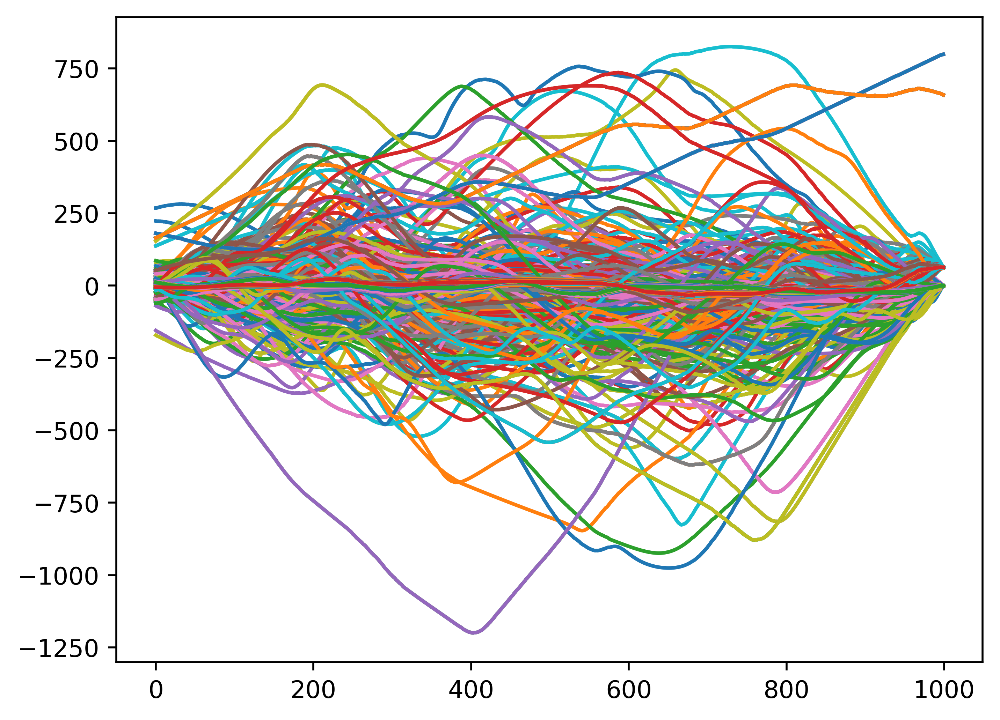

In [10]:
samples_runs = 50
# this will define the computational time

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])
sampler.run_mcmc(p0, samples_runs) 
samp = sampler.get_chain()

samp_reshaped = samp.reshape(samp.shape[0], -1) #so that the 3D array is reshaped as 2D, to save it 
np.savetxt('samples_emcee.txt',samp_reshaped, delimiter=',')

In [13]:
sampsubset = samp[0:samples_runs,:,:]
samp2d = sampsubset.reshape(sampsubset.shape[0]*sampsubset.shape[1],3)
samp2d.shape
samp2d

np.savetxt('bend4data.txt', np.c_[samp2d])    #year.bend

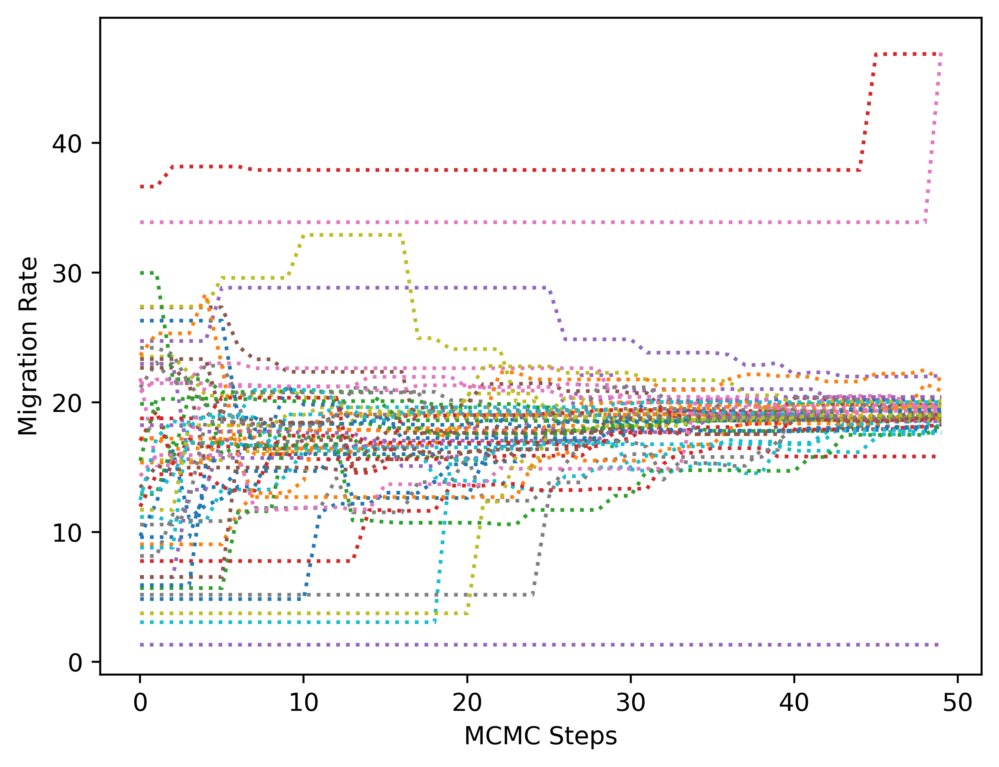

In [14]:
plt.plot(sampler.chain[:,:,0].T, ':')
plt.ylabel("Migration Rate",color='black')
plt.xlabel("MCMC Steps",color='black')


plt.savefig('migrations.PNG',dpi = 200)

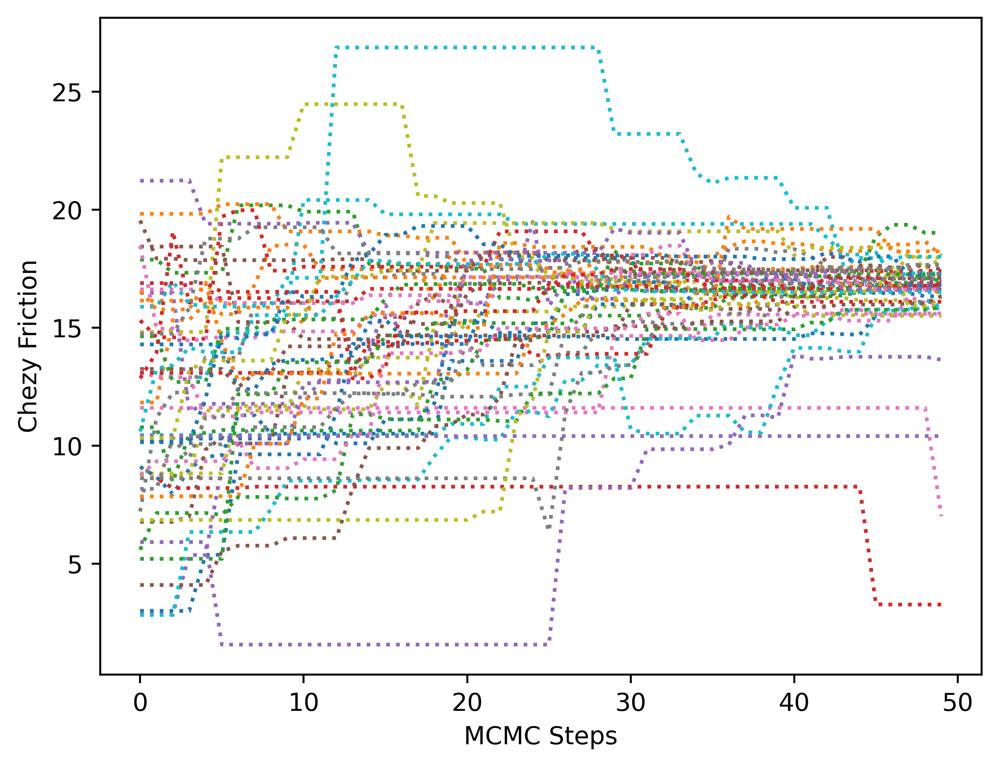

In [15]:
plt.plot(sampler.chain[:,:,1].T, ':')
plt.ylabel("Chezy Friction",color='black')
plt.xlabel("MCMC Steps",color='black')
plt.savefig('migrations.PNG',dpi = 200)

In [ ]:
plt.rcParams.update({'font.size': 22}) # must set in top

samp_df = pd.DataFrame(samp2d)
samp_df = samp_df.rename(columns={0: 'migration rate',  1: 'chezy', 2: 'error'})   

samp_df
sns.color_palette("mako")
sns.set(style="ticks")
b = sns.pairplot(samp_df)

plt.savefig('kde%s.PNG',dpi = 300)

100%|███████████████████████████████████████████| 50/50 [00:00<00:00, 88.59it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/1769439658.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/1769439658.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

640000
0
0


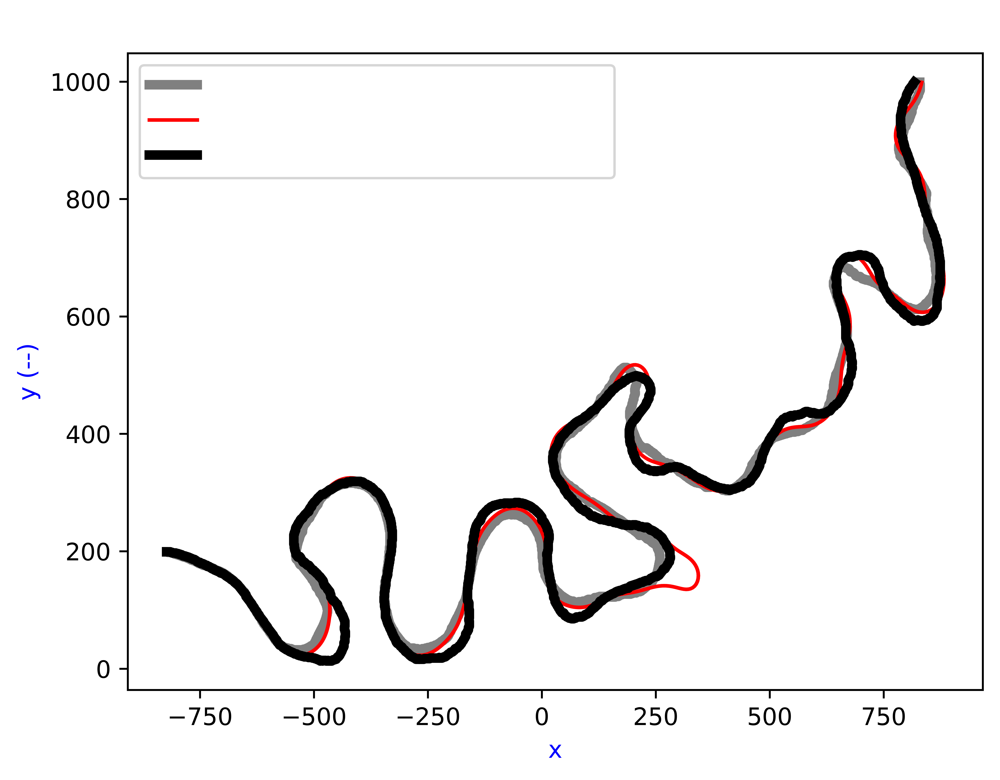

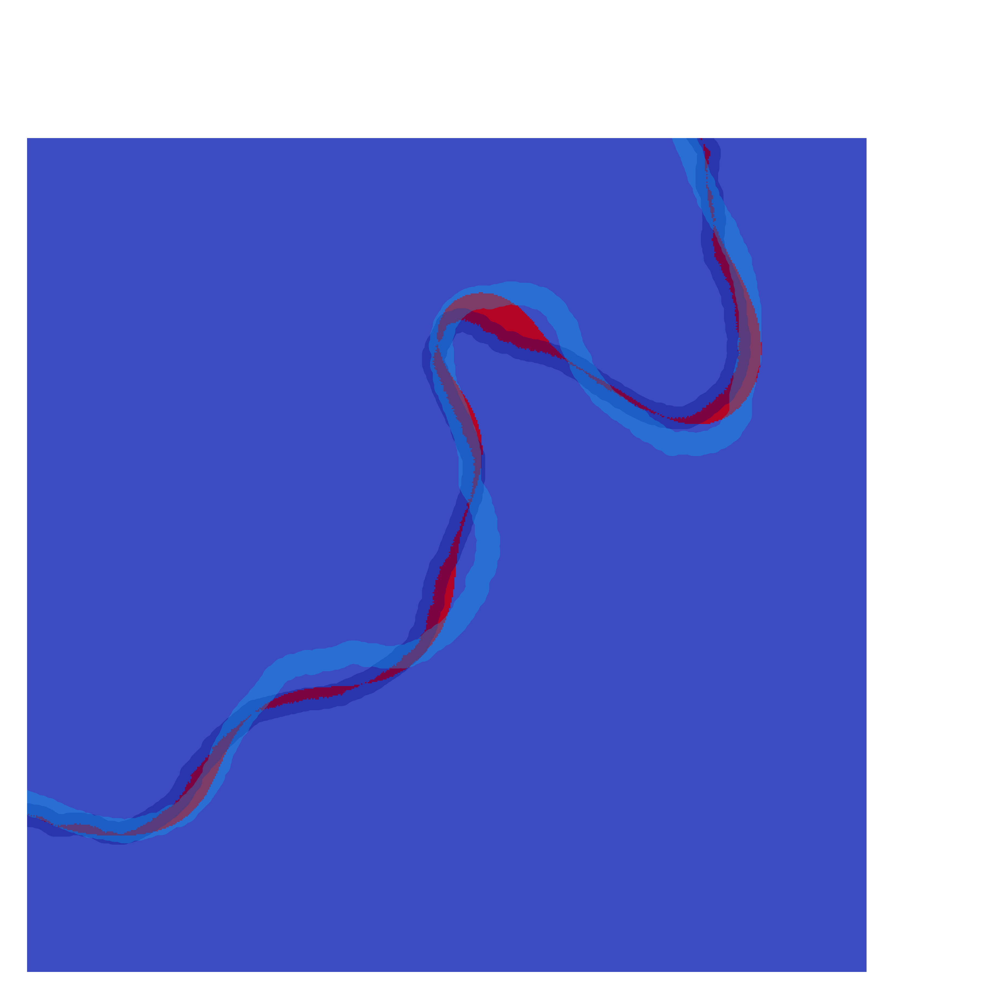

In [18]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL6.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 50                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 97.65it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/2834870107.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/2834870107.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

607033
11656
21311


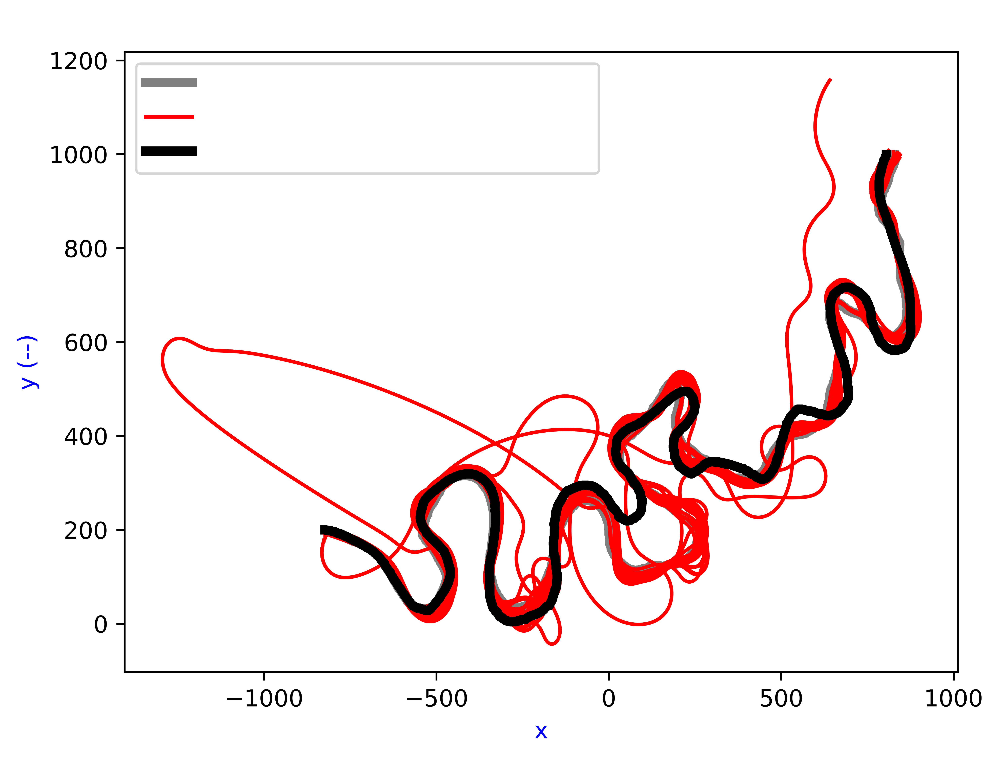

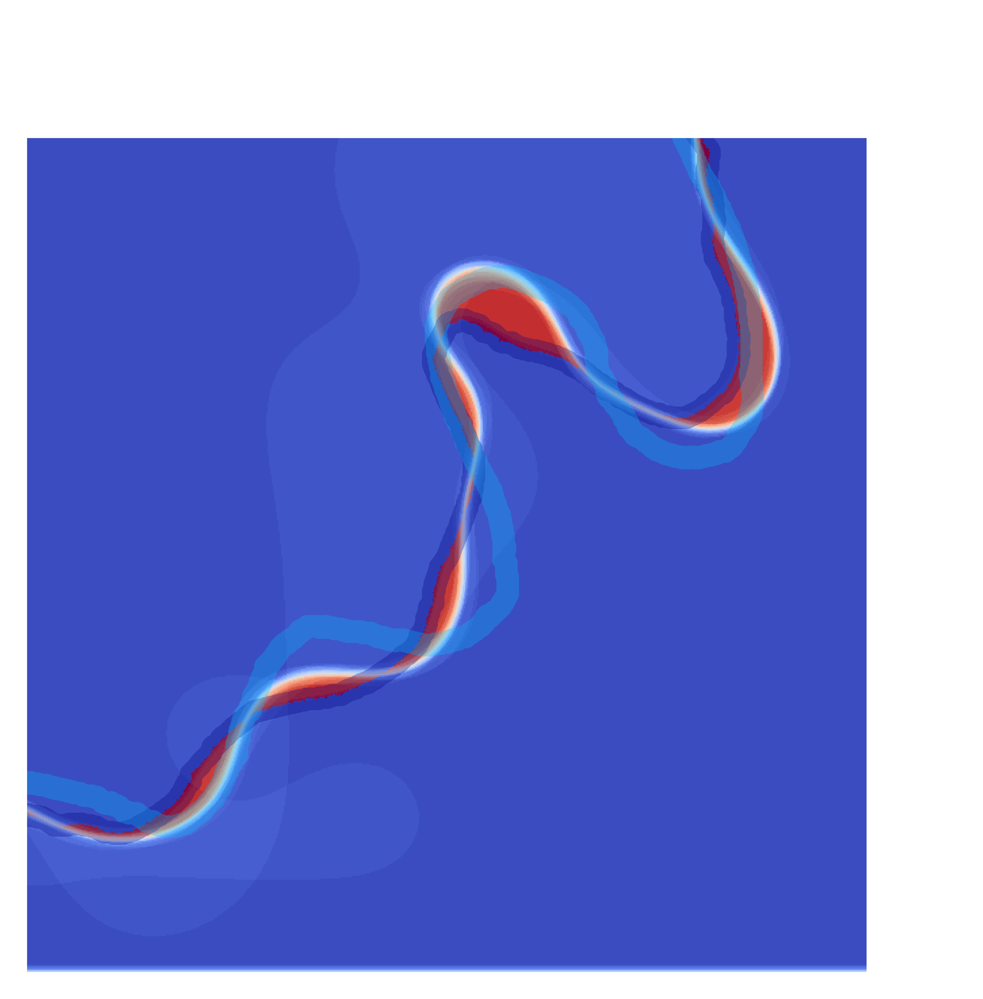

In [19]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL11.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 100                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 150/150 [00:01<00:00, 92.16it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/787522249.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/787522249.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

588942
19411
31647


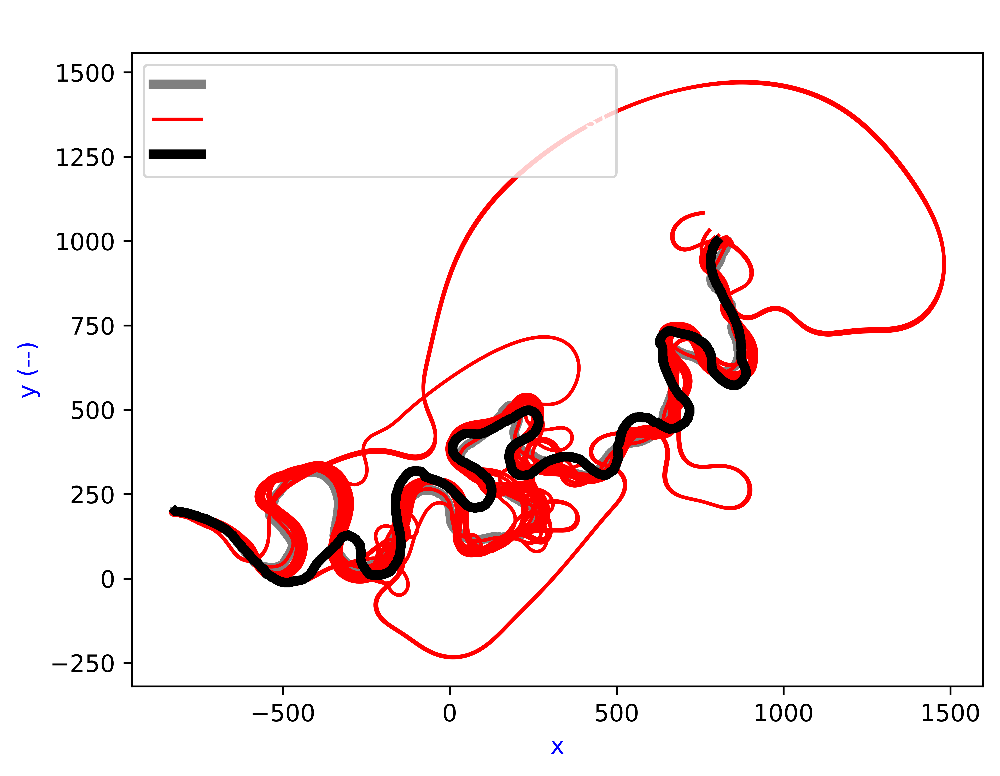

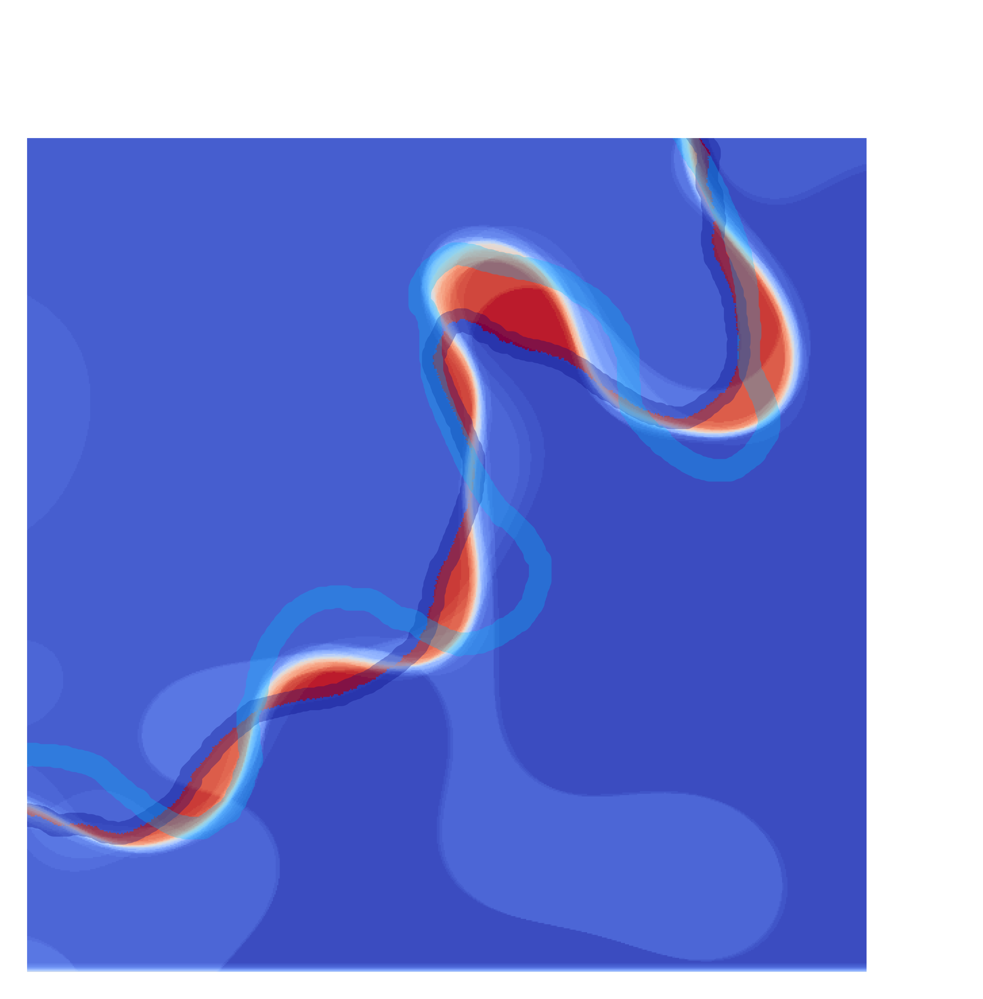

In [20]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL16.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 150                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 95.07it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/1914718060.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/1914718060.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

577353
15763
46884


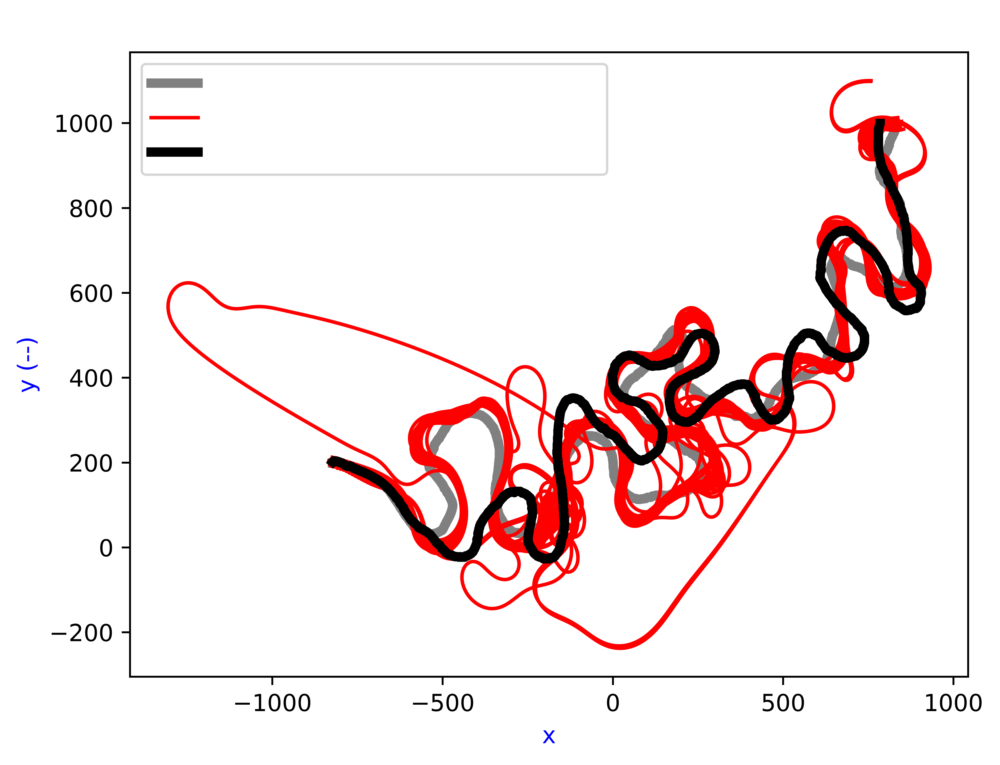

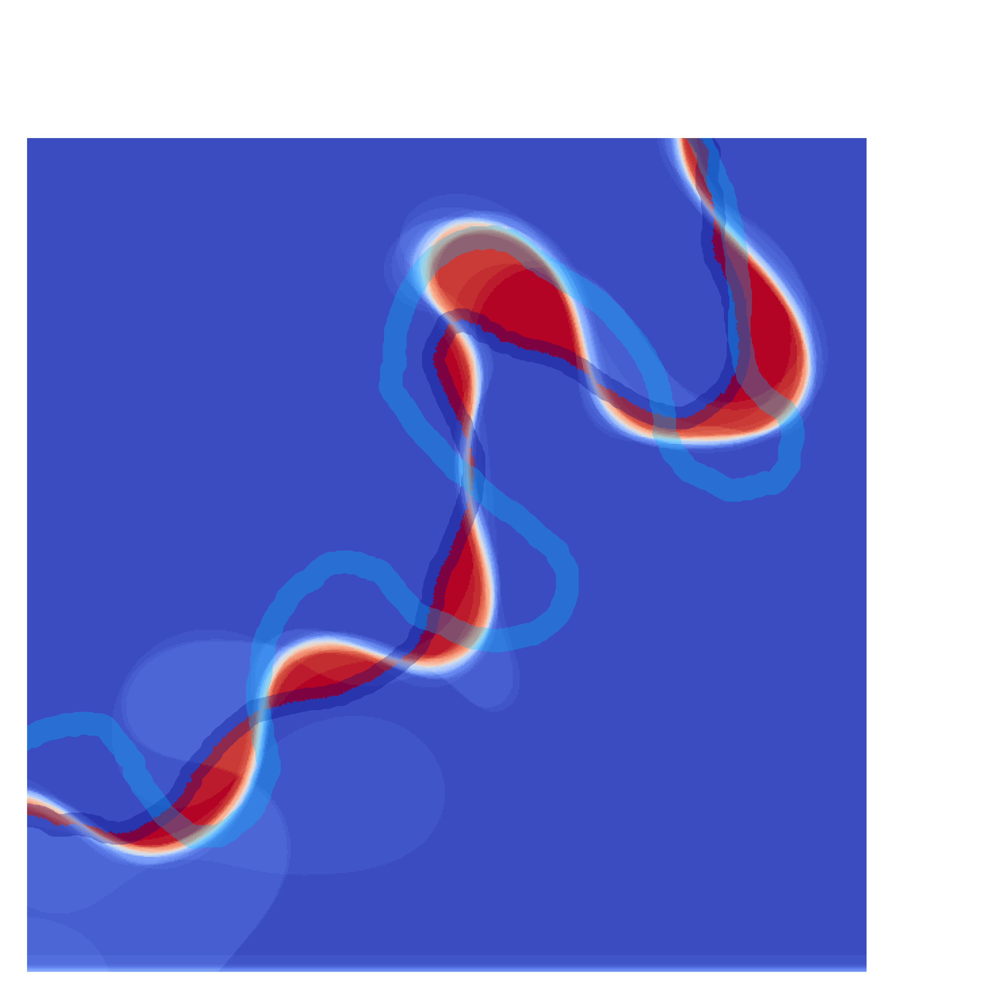

In [21]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL21.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 200                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 250/250 [00:02<00:00, 88.42it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/4091711359.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/4091711359.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

562281
31565
46154


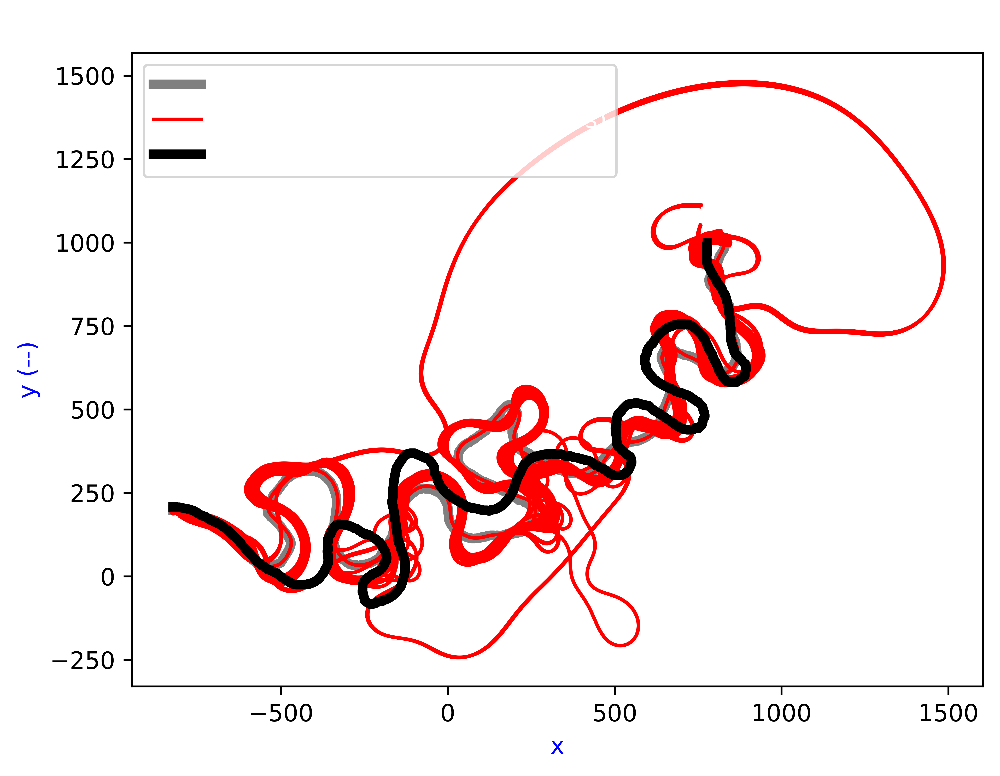

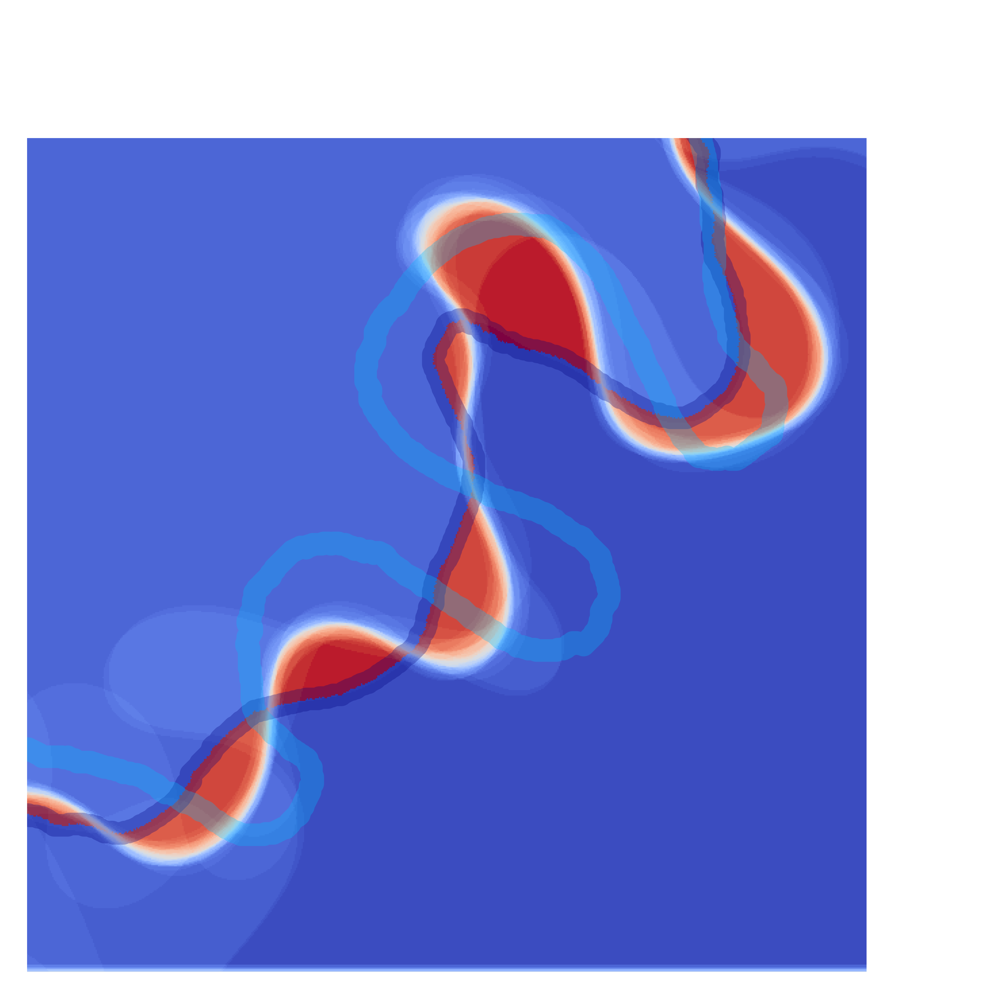

In [22]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL26.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 250                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 300/300 [00:03<00:00, 95.71it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/3719763458.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57422/3719763458.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

564533
16792
58675


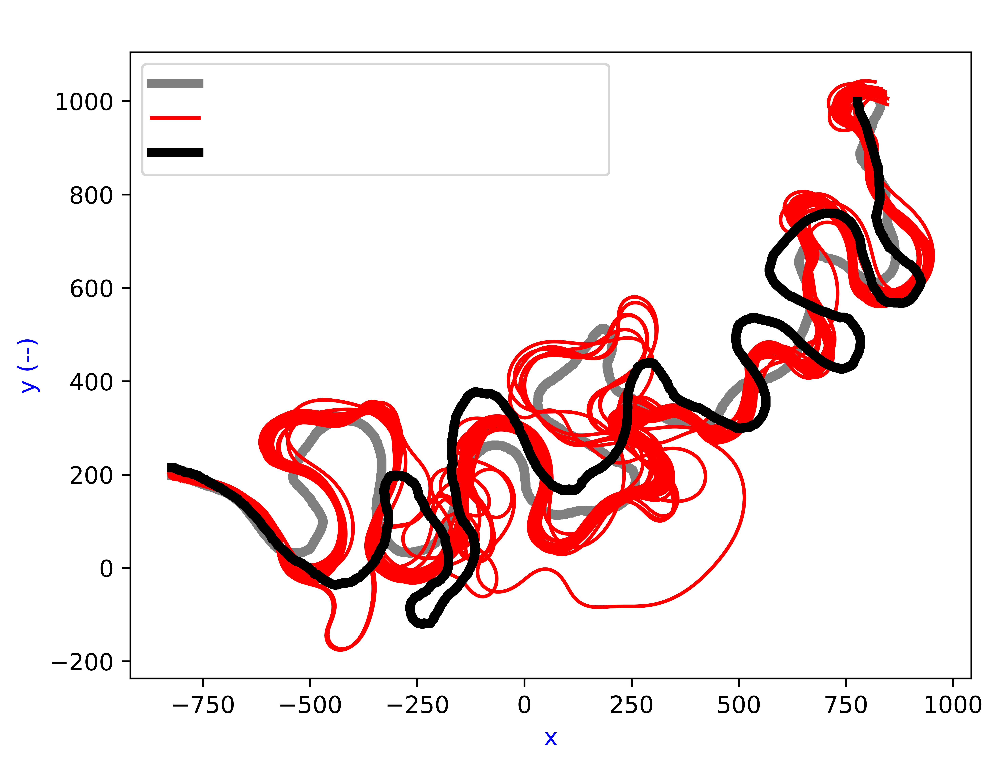

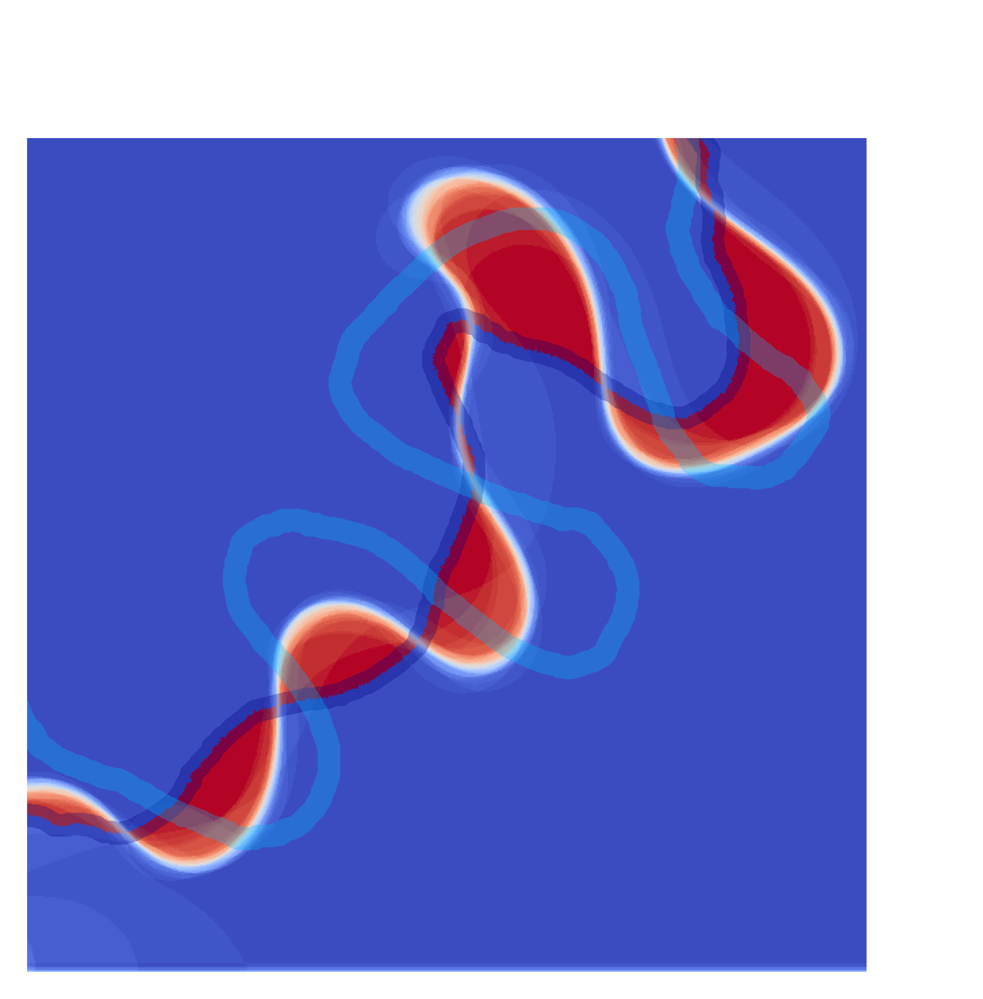

In [23]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend4")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL31.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 300                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([140, 760])
plt.ylim([0, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)